In [1]:
import numpy as np
import pandas as pd
from ydata_profiling import ProfileReport
import dtale
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
import seaborn as sns
import matplotlib.pyplot as plt

# Setting the stying of the Seaborn figure
sns.set_style('darkgrid')

In [2]:
path = "/home/reenal/personal/phd_Mölnlycke/2k98mvnk85-1/"

In [3]:
cost =pd.read_excel(rf'{path}coste_paciente.xlsx')
data =pd.read_excel(rf'{path}datos_analisis2.xlsx')


In [4]:
cost.head()

,ID CODE,Nurse costs,Dressing costs,Material costs,Secondary costs,Total costs,Dressing type
0,10001,29.250,73.8,8.576,0.0,111.626,Hydrocolloid
1,30001,38.775,73.8,9.664,0.0,122.239,Hydrocolloid
2,30003,15.000,69.7,3.535,0.0,88.235,Hydrocolloid
3,30005,46.250,NaN,8.140,0.0,54.390,Hydrocolloid
4,30006,18.750,57.4,1.682,0.0,77.832,Hydrocolloid


In [5]:
cost.shape

(169, 7)

In [6]:
data.head()

,ID code,Sex,Age,Baseline visit,num. visit,Dressing type,Ulcer_stage,"Cured: 1, no cured: 2",infected,Postural changes,red_friccion,Avoided_infecion,Braden Scale,Push Scale,porc_postural changes,porc_friccion,porc_infec,Loss to follow up,Location
0,270009,Female,86,2015-09-11,2.0,Hydrocellular,1,2,2,0,0,0,Riesgo moderado,15,NaN,NaN,NaN,2,Trochanter
1,470003,Female,92,2014-09-19,2.0,Hydrocellular,2,2,2,0,0,0,Riesgo moderado,4,NaN,NaN,NaN,1,Trochanter
2,30006,Female,88,2014-06-03,2.0,Hydrocolloid,2,2,1,0,0,0,Riesgo moderado,6,NaN,NaN,NaN,2,Trochanter
3,100005,Female,91,2014-03-11,3.0,Hydrocolloid,1,2,2,1,1,1,Riesgo moderado,12,1.0,1.0,1.0,2,Trochanter
4,100011,Female,86,2015-09-28,4.0,Hydrocolloid,1,2,2,2,2,0,Sin riesgo,6,1.0,1.0,0.0,2,Trochanter


In [7]:
data.shape

(169, 19)

In [8]:
cost.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 169 entries, 0 to 168
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ID CODE          169 non-null    int64  
 1   Nurse costs      169 non-null    float64
 2   Dressing costs   157 non-null    float64
 3   Material costs   169 non-null    float64
 4   Secondary costs  169 non-null    float64
 5   Total costs      169 non-null    float64
 6   Dressing type    169 non-null    object 
dtypes: float64(5), int64(1), object(1)
memory usage: 9.4+ KB


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 169 entries, 0 to 168
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   ID code                169 non-null    int64         
 1   Sex                    169 non-null    object        
 2   Age                    169 non-null    int64         
 3   Baseline visit         169 non-null    datetime64[ns]
 4   num. visit             168 non-null    float64       
 5   Dressing type          169 non-null    object        
 6   Ulcer_stage            169 non-null    int64         
 7   Cured: 1, no cured: 2  169 non-null    int64         
 8   infected               169 non-null    int64         
 9   Postural changes       169 non-null    int64         
 10  red_friccion           169 non-null    int64         
 11  Avoided_infecion       169 non-null    int64         
 12  Braden Scale           169 non-null    object        
 13  Push 

In [10]:
data = data.rename(columns={'ID code': 'ID CODE'})

In [11]:
cost['ID CODE'].value_counts()

10001     1
200002    1
100006    1
100007    1
100009    1
120003    1
120004    1
130001    1
160001    1
180002    1
230001    1
20001     1
230003    1
230006    1
230007    1
230009    1
250001    1
250002    1
250005    1
270002    1
100003    1
100002    1
70004     1
70003     1
30004     1
30007     1
30008     1
40002     1
40004     1
40007     1
50003     1
50004     1
50005     1
50008     1
50012     1
50014     1
50015     1
50017     1
60001     1
60004     1
60005     1
270003    1
270007    1
270008    1
460004    1
460008    1
460009    1
460010    1
470001    1
470003    1
470006    1
480002    1
480004    1
480007    1
480008    1
480011    1
480012    1
480014    1
480016    1
480018    1
500001    1
500002    1
460007    1
460002    1
270009    1
440003    1
320002    1
340001    1
350001    1
350002    1
360001    1
360002    1
370001    1
370002    1
380002    1
380003    1
400003    1
400004    1
400005    1
400006    1
400008    1
410001    1
440001    1
3000

In [12]:
data['ID CODE'].value_counts()

270009    1
270008    1
460003    1
120004    1
270002    1
270003    1
400008    1
100008    1
100002    1
120003    1
400006    1
370001    1
570002    1
60006     1
210002    1
400002    1
320002    1
380003    1
60002     1
40002     1
460001    1
360003    1
320001    1
280001    1
400004    1
440003    1
460007    1
460008    1
460009    1
470001    1
480007    1
500001    1
10001     1
30001     1
30003     1
50007     1
230002    1
230004    1
230005    1
230008    1
270005    1
400005    1
90001     1
100010    1
480010    1
480015    1
40004     1
230001    1
250002    1
360001    1
460004    1
480002    1
480011    1
480014    1
50001     1
60003     1
130002    1
200001    1
230010    1
270001    1
400001    1
400007    1
480013    1
480009    1
100003    1
480006    1
100006    1
100007    1
100009    1
230006    1
250001    1
270007    1
340001    1
360002    1
400003    1
480008    1
480012    1
480016    1
80001     1
120001    1
330001    1
460006    1
480001    1
3700

In [13]:
data[data['ID CODE'] == 10001] 

,ID CODE,Sex,Age,Baseline visit,num. visit,Dressing type,Ulcer_stage,"Cured: 1, no cured: 2",infected,Postural changes,red_friccion,Avoided_infecion,Braden Scale,Push Scale,porc_postural changes,porc_friccion,porc_infec,Loss to follow up,Location
95,10001,Male,91,2014-07-28,3.0,Hydrocolloid,1,2,2,0,0,0,Sin riesgo,14,0.0,0.0,0.0,2,Sacrum


In [14]:
final   = data.merge(cost, on='ID CODE')

In [15]:
final.shape

(169, 25)

In [16]:
final.head()

,ID CODE,Sex,Age,Baseline visit,num. visit,Dressing type_x,Ulcer_stage,"Cured: 1, no cured: 2",infected,Postural changes,red_friccion,Avoided_infecion,Braden Scale,Push Scale,porc_postural changes,porc_friccion,porc_infec,Loss to follow up,Location,Nurse costs,Dressing costs,Material costs,Secondary costs,Total costs,Dressing type_y
0,270009,Female,86,2015-09-11,2.0,Hydrocellular,1,2,2,0,0,0,Riesgo moderado,15,NaN,NaN,NaN,2,Trochanter,5.000000,46.53,3.368,0.00,54.898000,Hydrocellular
1,470003,Female,92,2014-09-19,2.0,Hydrocellular,2,2,2,0,0,0,Riesgo moderado,4,NaN,NaN,NaN,1,Trochanter,3.645833,40.92,2.004,0.00,46.569833,Hydrocellular
2,30006,Female,88,2014-06-03,2.0,Hydrocolloid,2,2,1,0,0,0,Riesgo moderado,6,NaN,NaN,NaN,2,Trochanter,18.750000,57.40,1.682,0.00,77.832000,Hydrocolloid
3,100005,Female,91,2014-03-11,3.0,Hydrocolloid,1,2,2,1,1,1,Riesgo moderado,12,1.0,1.0,1.0,2,Trochanter,10.750000,45.10,2.680,0.00,58.530000,Hydrocolloid
4,100011,Female,86,2015-09-28,4.0,Hydrocolloid,1,2,2,2,2,0,Sin riesgo,6,1.0,1.0,0.0,2,Trochanter,19.250000,69.70,7.808,0.07,96.828000,Hydrocolloid


In [17]:
final['ID CODE'].value_counts()

270009    1
270008    1
460003    1
120004    1
270002    1
270003    1
400008    1
100008    1
100002    1
120003    1
400006    1
370001    1
570002    1
60006     1
210002    1
400002    1
320002    1
380003    1
60002     1
40002     1
460001    1
360003    1
320001    1
280001    1
400004    1
440003    1
460007    1
460008    1
460009    1
470001    1
480007    1
500001    1
10001     1
30001     1
30003     1
50007     1
230002    1
230004    1
230005    1
230008    1
270005    1
400005    1
90001     1
100010    1
480010    1
480015    1
40004     1
230001    1
250002    1
360001    1
460004    1
480002    1
480011    1
480014    1
50001     1
60003     1
130002    1
200001    1
230010    1
270001    1
400001    1
400007    1
480013    1
480009    1
100003    1
480006    1
100006    1
100007    1
100009    1
230006    1
250001    1
270007    1
340001    1
360002    1
400003    1
480008    1
480012    1
480016    1
80001     1
120001    1
330001    1
460006    1
480001    1
3700

In [18]:
final[final['ID CODE'] == 10001] 

,ID CODE,Sex,Age,Baseline visit,num. visit,Dressing type_x,Ulcer_stage,"Cured: 1, no cured: 2",infected,Postural changes,red_friccion,Avoided_infecion,Braden Scale,Push Scale,porc_postural changes,porc_friccion,porc_infec,Loss to follow up,Location,Nurse costs,Dressing costs,Material costs,Secondary costs,Total costs,Dressing type_y
95,10001,Male,91,2014-07-28,3.0,Hydrocolloid,1,2,2,0,0,0,Sin riesgo,14,0.0,0.0,0.0,2,Sacrum,29.25,73.8,8.576,0.0,111.626,Hydrocolloid


In [19]:
profile = ProfileReport(final, title="Pandas Profiling Report")

In [20]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [22]:
d = dtale.show(final)

In [23]:
d

In [24]:
d._main_url # /user/johndoe/proxy/40000/dtale/main/1

'http://LAPTOP-1QDROFMG:40000/dtale/main/2'

In [25]:
#this works
#http://localhost:40000/dtale/main/1

In [26]:
d._data_id

2

In [27]:
# DISCLAIMER: 'df' refers to the data you passed in when calling 'dtale.show'

df=final

import pandas as pd

if isinstance(df, (pd.DatetimeIndex, pd.MultiIndex)):
	df = df.to_frame(index=False)

# remove any pre-existing indices for ease of use in the D-Tale code, but this is not required
df = df.reset_index().drop('index', axis=1, errors='ignore')
df.columns = [str(c) for c in df.columns]  # update columns to strings in case they are numbers

chart_data = pd.concat([
	df['Sex'],
	df['ID CODE'],
], axis=1)
chart_data = chart_data.sort_values(['Sex'])
chart_data = chart_data.rename(columns={'Sex': 'x'})
chart_data_count = chart_data.groupby(['x'], dropna=True)[['ID CODE']].count()
chart_data_count.columns = ['ID CODE|count']
chart_data = chart_data_count.reset_index()
chart_data = chart_data.dropna()

import plotly.graph_objs as go

charts = []
charts.append(go.Bar(
	x=chart_data['x'],
	y=chart_data['ID CODE|count'],
    text=chart_data['ID CODE|count'],
    textposition='auto',
))
figure = go.Figure(data=charts, layout=go.Layout({
    'barmode': 'group',
    'legend': {'orientation': 'h', 'y': -0.3},
    'title': {'text': 'Count of ID CODE by Sex'},
    'xaxis': {'title': {'text': 'Sex'}},
    'yaxis': {'tickformat': '0:g', 'title': {'text': 'Count of ID CODE'}, 'type': 'linear'}
}))

# If you're having trouble viewing your chart in your notebook try passing your 'chart' into this snippet:
#
from plotly.offline import iplot, init_notebook_mode
#
init_notebook_mode(connected=True)
for chart in charts:
    chart.pop('id', None) # for some reason iplot does not like 'id'
iplot(figure)

In [28]:
# DISCLAIMER: 'df' refers to the data you passed in when calling 'dtale.show'
df=final

import pandas as pd

if isinstance(df, (pd.DatetimeIndex, pd.MultiIndex)):
	df = df.to_frame(index=False)

# remove any pre-existing indices for ease of use in the D-Tale code, but this is not required
df = df.reset_index().drop('index', axis=1, errors='ignore')
df.columns = [str(c) for c in df.columns]  # update columns to strings in case they are numbers

chart_data = pd.concat([
	df['Dressing type_x'],
	df['ID CODE'],
], axis=1)
chart_data = chart_data.sort_values(['Dressing type_x'])
chart_data = chart_data.rename(columns={'Dressing type_x': 'x'})
chart_data_count = chart_data.groupby(['x'], dropna=True)[['ID CODE']].count()
chart_data_count.columns = ['ID CODE|count']
chart_data = chart_data_count.reset_index()
chart_data = chart_data.dropna()

import plotly.graph_objs as go

charts = []
charts.append(go.Bar(
	x=chart_data['x'],
	y=chart_data['ID CODE|count'],
    text=chart_data['ID CODE|count'],
))
figure = go.Figure(data=charts, layout=go.Layout({
    'barmode': 'group',
    'legend': {'orientation': 'h', 'y': -0.3},
    'title': {'text': 'Count of ID CODE by Dressing type_x'},
    'xaxis': {'title': {'text': 'Dressing type_x'}},
    'yaxis': {'tickformat': '0:g', 'title': {'text': 'Count of ID CODE'}, 'type': 'linear'}
}))

# If you're having trouble viewing your chart in your notebook try passing your 'chart' into this snippet:
#
from plotly.offline import iplot, init_notebook_mode
#
init_notebook_mode(connected=True)
for chart in charts:
    chart.pop('id', None) # for some reason iplot does not like 'id'
    iplot(figure)

In [29]:
# DISCLAIMER: 'df' refers to the data you passed in when calling 'dtale.show'
df=final

import pandas as pd

if isinstance(df, (pd.DatetimeIndex, pd.MultiIndex)):
	df = df.to_frame(index=False)

# remove any pre-existing indices for ease of use in the D-Tale code, but this is not required
df = df.reset_index().drop('index', axis=1, errors='ignore')
df.columns = [str(c) for c in df.columns]  # update columns to strings in case they are numbers

chart_data = pd.concat([
	df['Ulcer_stage'],
	df['ID CODE'],
], axis=1)
chart_data = chart_data.sort_values(['Ulcer_stage'])
chart_data = chart_data.rename(columns={'Ulcer_stage': 'x'})
chart_data_count = chart_data.groupby(['x'], dropna=True)[['ID CODE']].count()
chart_data_count.columns = ['ID CODE|count']
chart_data = chart_data_count.reset_index()
chart_data = chart_data.dropna()

import plotly.graph_objs as go

charts = []
charts.append(go.Bar(
	x=chart_data['x'],
	y=chart_data['ID CODE|count'],
    text=chart_data['ID CODE|count'],
))
figure = go.Figure(data=charts, layout=go.Layout({
    'barmode': 'group',
    'legend': {'orientation': 'h', 'y': -0.3},
    'title': {'text': 'Count of ID CODE by Ulcer_stage'},
    'xaxis': {'tickformat': '0:g', 'title': {'text': 'Ulcer_stage'}},
    'yaxis': {'tickformat': '0:g', 'title': {'text': 'Count of ID CODE'}, 'type': 'linear'}
}))

# If you're having trouble viewing your chart in your notebook try passing your 'chart' into this snippet:
#
from plotly.offline import iplot, init_notebook_mode
#
init_notebook_mode(connected=True)
for chart in charts:
    chart.pop('id', None) # for some reason iplot does not like 'id'
    iplot(figure)

In [30]:
final.columns

Index(['ID CODE', 'Sex', 'Age', 'Baseline visit', 'num. visit',
       'Dressing type_x', 'Ulcer_stage', 'Cured: 1, no cured: 2', 'infected',
       'Postural changes', 'red_friccion', 'Avoided_infecion', 'Braden Scale',
       'Push Scale', 'porc_postural changes', 'porc_friccion', 'porc_infec',
       'Loss to follow up', 'Location', 'Nurse costs', 'Dressing costs',
       'Material costs', 'Secondary costs', 'Total costs', 'Dressing type_y'],
      dtype='object')

In [31]:
# DISCLAIMER: 'df' refers to the data you passed in when calling 'dtale.show'
df=final

import pandas as pd

if isinstance(df, (pd.DatetimeIndex, pd.MultiIndex)):
	df = df.to_frame(index=False)

# remove any pre-existing indices for ease of use in the D-Tale code, but this is not required
df = df.reset_index().drop('index', axis=1, errors='ignore')
df.columns = [str(c) for c in df.columns]  # update columns to strings in case they are numbers

chart_data = pd.concat([
	df['Cured: 1, no cured: 2'],
	df['ID CODE'],
], axis=1)
chart_data = chart_data.sort_values(['Cured: 1, no cured: 2'])
chart_data = chart_data.rename(columns={'Cured: 1, no cured: 2': 'x'})
chart_data_count = chart_data.groupby(['x'], dropna=True)[['ID CODE']].count()
chart_data_count.columns = ['ID CODE|count']
chart_data = chart_data_count.reset_index()
chart_data = chart_data.dropna()

import plotly.graph_objs as go

charts = []
charts.append(go.Bar(
	x=chart_data['x'],
	y=chart_data['ID CODE|count'],
    text=chart_data['ID CODE|count'],
))
figure = go.Figure(data=charts, layout=go.Layout({
    'barmode': 'group',
    'legend': {'orientation': 'h', 'y': -0.3},
    'title': {'text': 'Count of ID CODE by Cured: 1, no cured: 2'},
    'xaxis': {'tickformat': '0:g', 'title': {'text': 'Cured: 1, no cured: 2'}},
    'yaxis': {'tickformat': '0:g', 'title': {'text': 'Count of ID CODE'}, 'type': 'linear'}
}))

# If you're having trouble viewing your chart in your notebook try passing your 'chart' into this snippet:
#
from plotly.offline import iplot, init_notebook_mode
#
init_notebook_mode(connected=True)
for chart in charts:
    chart.pop('id', None) # for some reason iplot does not like 'id'
    iplot(figure)

In [32]:
# DISCLAIMER: 'df' refers to the data you passed in when calling 'dtale.show'
df=final
import pandas as pd

if isinstance(df, (pd.DatetimeIndex, pd.MultiIndex)):
	df = df.to_frame(index=False)

# remove any pre-existing indices for ease of use in the D-Tale code, but this is not required
df = df.reset_index().drop('index', axis=1, errors='ignore')
df.columns = [str(c) for c in df.columns]  # update columns to strings in case they are numbers

chart_data = pd.concat([
	df['infected'],
	df['ID CODE'],
], axis=1)
chart_data = chart_data.sort_values(['infected'])
chart_data = chart_data.rename(columns={'infected': 'x'})
chart_data_count = chart_data.groupby(['x'], dropna=True)[['ID CODE']].count()
chart_data_count.columns = ['ID CODE|count']
chart_data = chart_data_count.reset_index()
chart_data = chart_data.dropna()

import plotly.graph_objs as go

charts = []
charts.append(go.Bar(
	x=chart_data['x'],
	y=chart_data['ID CODE|count'],
    text=chart_data['ID CODE|count'],
))
figure = go.Figure(data=charts, layout=go.Layout({
    'barmode': 'group',
    'legend': {'orientation': 'h', 'y': -0.3},
    'title': {'text': 'Count of ID CODE by infected'},
    'xaxis': {'tickformat': '0:g', 'title': {'text': 'infected'}},
    'yaxis': {'tickformat': '0:g', 'title': {'text': 'Count of ID CODE'}, 'type': 'linear'}
}))

# If you're having trouble viewing your chart in your notebook try passing your 'chart' into this snippet:
#
# from plotly.offline import iplot, init_notebook_mode
#
init_notebook_mode(connected=True)
for chart in charts:
    chart.pop('id', None) # for some reason iplot does not like 'id'
    iplot(figure)

In [33]:
# DISCLAIMER: 'df' refers to the data you passed in when calling 'dtale.show'
df=final

import pandas as pd

if isinstance(df, (pd.DatetimeIndex, pd.MultiIndex)):
	df = df.to_frame(index=False)

# remove any pre-existing indices for ease of use in the D-Tale code, but this is not required
df = df.reset_index().drop('index', axis=1, errors='ignore')
df.columns = [str(c) for c in df.columns]  # update columns to strings in case they are numbers

chart_data = pd.concat([
	df['Postural changes'],
	df['ID CODE'],
], axis=1)
chart_data = chart_data.sort_values(['Postural changes'])
chart_data = chart_data.rename(columns={'Postural changes': 'x'})
chart_data_count = chart_data.groupby(['x'], dropna=True)[['ID CODE']].count()
chart_data_count.columns = ['ID CODE|count']
chart_data = chart_data_count.reset_index()
chart_data = chart_data.dropna()

import plotly.graph_objs as go

charts = []
charts.append(go.Bar(
	x=chart_data['x'],
	y=chart_data['ID CODE|count'],
    text=chart_data['ID CODE|count'],
))
figure = go.Figure(data=charts, layout=go.Layout({
    'barmode': 'group',
    'legend': {'orientation': 'h', 'y': -0.3},
    'title': {'text': 'Count of ID CODE by Postural changes'},
    'xaxis': {'tickformat': '0:g', 'title': {'text': 'Postural changes'}},
    'yaxis': {'tickformat': '0:g', 'title': {'text': 'Count of ID CODE'}, 'type': 'linear'}
}))

# If you're having trouble viewing your chart in your notebook try passing your 'chart' into this snippet:
#
from plotly.offline import iplot, init_notebook_mode
#
init_notebook_mode(connected=True)
for chart in charts:
    chart.pop('id', None) # for some reason iplot does not like 'id'
    iplot(figure)

In [34]:
final.columns

Index(['ID CODE', 'Sex', 'Age', 'Baseline visit', 'num. visit',
       'Dressing type_x', 'Ulcer_stage', 'Cured: 1, no cured: 2', 'infected',
       'Postural changes', 'red_friccion', 'Avoided_infecion', 'Braden Scale',
       'Push Scale', 'porc_postural changes', 'porc_friccion', 'porc_infec',
       'Loss to follow up', 'Location', 'Nurse costs', 'Dressing costs',
       'Material costs', 'Secondary costs', 'Total costs', 'Dressing type_y'],
      dtype='object')

In [35]:
# DISCLAIMER: 'df' refers to the data you passed in when calling 'dtale.show'
df=final

import pandas as pd

if isinstance(df, (pd.DatetimeIndex, pd.MultiIndex)):
	df = df.to_frame(index=False)

# remove any pre-existing indices for ease of use in the D-Tale code, but this is not required
df = df.reset_index().drop('index', axis=1, errors='ignore')
df.columns = [str(c) for c in df.columns]  # update columns to strings in case they are numbers

chart_data = pd.concat([
	df['red_friccion'],
	df['ID CODE'],
], axis=1)
chart_data = chart_data.sort_values(['red_friccion'])
chart_data = chart_data.rename(columns={'red_friccion': 'x'})
chart_data_count = chart_data.groupby(['x'], dropna=True)[['ID CODE']].count()
chart_data_count.columns = ['ID CODE|count']
chart_data = chart_data_count.reset_index()
chart_data = chart_data.dropna()

import plotly.graph_objs as go

charts = []
charts.append(go.Bar(
	x=chart_data['x'],
	y=chart_data['ID CODE|count'],
    text=chart_data['ID CODE|count'],
))
figure = go.Figure(data=charts, layout=go.Layout({
    'barmode': 'group',
    'legend': {'orientation': 'h', 'y': -0.3},
    'title': {'text': 'Count of ID CODE by red_friccion'},
    'xaxis': {'tickformat': '0:g', 'title': {'text': 'red_friccion'}},
    'yaxis': {'tickformat': '0:g', 'title': {'text': 'Count of ID CODE'}, 'type': 'linear'}
}))

# If you're having trouble viewing your chart in your notebook try passing your 'chart' into this snippet:
#
from plotly.offline import iplot, init_notebook_mode
#
init_notebook_mode(connected=True)
for chart in charts:
    chart.pop('id', None) # for some reason iplot does not like 'id'
    iplot(figure)

In [36]:
# DISCLAIMER: 'df' refers to the data you passed in when calling 'dtale.show'
df=final

import pandas as pd

if isinstance(df, (pd.DatetimeIndex, pd.MultiIndex)):
	df = df.to_frame(index=False)

# remove any pre-existing indices for ease of use in the D-Tale code, but this is not required
df = df.reset_index().drop('index', axis=1, errors='ignore')
df.columns = [str(c) for c in df.columns]  # update columns to strings in case they are numbers

chart_data = pd.concat([
	df['Avoided_infecion'],
	df['ID CODE'],
], axis=1)
chart_data = chart_data.sort_values(['Avoided_infecion'])
chart_data = chart_data.rename(columns={'Avoided_infecion': 'x'})
chart_data_count = chart_data.groupby(['x'], dropna=True)[['ID CODE']].count()
chart_data_count.columns = ['ID CODE|count']
chart_data = chart_data_count.reset_index()
chart_data = chart_data.dropna()

import plotly.graph_objs as go

charts = []
charts.append(go.Bar(
	x=chart_data['x'],
	y=chart_data['ID CODE|count'],
    text=chart_data['ID CODE|count'],
))
figure = go.Figure(data=charts, layout=go.Layout({
    'barmode': 'group',
    'legend': {'orientation': 'h', 'y': -0.3},
    'title': {'text': 'Count of ID CODE by Avoided_infecion'},
    'xaxis': {'tickformat': '0:g', 'title': {'text': 'Avoided_infecion'}},
    'yaxis': {'tickformat': '0:g', 'title': {'text': 'Count of ID CODE'}, 'type': 'linear'}
}))

# If you're having trouble viewing your chart in your notebook try passing your 'chart' into this snippet:
#
from plotly.offline import iplot, init_notebook_mode
#
init_notebook_mode(connected=True)
for chart in charts:
    chart.pop('id', None) # for some reason iplot does not like 'id'
    iplot(figure)

In [37]:
# DISCLAIMER: 'df' refers to the data you passed in when calling 'dtale.show'
df=final

import pandas as pd

if isinstance(df, (pd.DatetimeIndex, pd.MultiIndex)):
	df = df.to_frame(index=False)

# remove any pre-existing indices for ease of use in the D-Tale code, but this is not required
df = df.reset_index().drop('index', axis=1, errors='ignore')
df.columns = [str(c) for c in df.columns]  # update columns to strings in case they are numbers

chart_data = pd.concat([
	df['Braden Scale'],
	df['ID CODE'],
], axis=1)
chart_data = chart_data.sort_values(['Braden Scale'])
chart_data = chart_data.rename(columns={'Braden Scale': 'x'})
chart_data_count = chart_data.groupby(['x'], dropna=True)[['ID CODE']].count()
chart_data_count.columns = ['ID CODE|count']
chart_data = chart_data_count.reset_index()
chart_data = chart_data.dropna()

import plotly.graph_objs as go

charts = []
charts.append(go.Bar(
	x=chart_data['x'],
	y=chart_data['ID CODE|count'],
    text=chart_data['ID CODE|count'],
))
figure = go.Figure(data=charts, layout=go.Layout({
    'barmode': 'group',
    'legend': {'orientation': 'h', 'y': -0.3},
    'title': {'text': 'Count of ID CODE by Braden Scale'},
    'xaxis': {'title': {'text': 'Braden Scale'}},
    'yaxis': {'tickformat': '0:g', 'title': {'text': 'Count of ID CODE'}, 'type': 'linear'}
}))

# If you're having trouble viewing your chart in your notebook try passing your 'chart' into this snippet:
#
from plotly.offline import iplot, init_notebook_mode
#
init_notebook_mode(connected=True)
for chart in charts:
    chart.pop('id', None) # for some reason iplot does not like 'id'
    iplot(figure)

In [38]:
# DISCLAIMER: 'df' refers to the data you passed in when calling 'dtale.show'
df=final

import pandas as pd

if isinstance(df, (pd.DatetimeIndex, pd.MultiIndex)):
	df = df.to_frame(index=False)

# remove any pre-existing indices for ease of use in the D-Tale code, but this is not required
df = df.reset_index().drop('index', axis=1, errors='ignore')
df.columns = [str(c) for c in df.columns]  # update columns to strings in case they are numbers

chart_data = pd.concat([
	df['Push Scale'],
	df['ID CODE'],
], axis=1)
chart_data = chart_data.sort_values(['Push Scale'])
chart_data = chart_data.rename(columns={'Push Scale': 'x'})
chart_data_count = chart_data.groupby(['x'], dropna=True)[['ID CODE']].count()
chart_data_count.columns = ['ID CODE|count']
chart_data = chart_data_count.reset_index()
chart_data = chart_data.dropna()

import plotly.graph_objs as go

charts = []
charts.append(go.Bar(
	x=chart_data['x'],
	y=chart_data['ID CODE|count'],
    text=chart_data['ID CODE|count'],
))
figure = go.Figure(data=charts, layout=go.Layout({
    'barmode': 'group',
    'legend': {'orientation': 'h', 'y': -0.3},
    'title': {'text': 'Count of ID CODE by Push Scale'},
    'xaxis': {'tickformat': '0:g', 'title': {'text': 'Push Scale'}},
    'yaxis': {'tickformat': '0:g', 'title': {'text': 'Count of ID CODE'}, 'type': 'linear'}
}))

# If you're having trouble viewing your chart in your notebook try passing your 'chart' into this snippet:
#
from plotly.offline import iplot, init_notebook_mode
#
init_notebook_mode(connected=True)
for chart in charts:
    chart.pop('id', None) # for some reason iplot does not like 'id'
    iplot(figure)

In [39]:
# DISCLAIMER: 'df' refers to the data you passed in when calling 'dtale.show'
df=final
import pandas as pd

if isinstance(df, (pd.DatetimeIndex, pd.MultiIndex)):
	df = df.to_frame(index=False)

# remove any pre-existing indices for ease of use in the D-Tale code, but this is not required
df = df.reset_index().drop('index', axis=1, errors='ignore')
df.columns = [str(c) for c in df.columns]  # update columns to strings in case they are numbers

chart_data = pd.concat([
	df['Loss to follow up'],
	df['ID CODE'],
], axis=1)
chart_data = chart_data.sort_values(['Loss to follow up'])
chart_data = chart_data.rename(columns={'Loss to follow up': 'x'})
chart_data_count = chart_data.groupby(['x'], dropna=True)[['ID CODE']].count()
chart_data_count.columns = ['ID CODE|count']
chart_data = chart_data_count.reset_index()
chart_data = chart_data.dropna()

import plotly.graph_objs as go

charts = []
charts.append(go.Bar(
	x=chart_data['x'],
	y=chart_data['ID CODE|count'],
    text=chart_data['ID CODE|count'],
))
figure = go.Figure(data=charts, layout=go.Layout({
    'barmode': 'group',
    'legend': {'orientation': 'h', 'y': -0.3},
    'title': {'text': 'Count of ID CODE by Loss to follow up'},
    'xaxis': {'tickformat': '0:g', 'title': {'text': 'Loss to follow up'}},
    'yaxis': {'tickformat': '0:g', 'title': {'text': 'Count of ID CODE'}, 'type': 'linear'}
}))

# If you're having trouble viewing your chart in your notebook try passing your 'chart' into this snippet:
#
from plotly.offline import iplot, init_notebook_mode
#
init_notebook_mode(connected=True)
for chart in charts:
    chart.pop('id', None) # for some reason iplot does not like 'id'
    iplot(figure)

In [40]:
# DISCLAIMER: 'df' refers to the data you passed in when calling 'dtale.show'
df=final
import pandas as pd

if isinstance(df, (pd.DatetimeIndex, pd.MultiIndex)):
	df = df.to_frame(index=False)

# remove any pre-existing indices for ease of use in the D-Tale code, but this is not required
df = df.reset_index().drop('index', axis=1, errors='ignore')
df.columns = [str(c) for c in df.columns]  # update columns to strings in case they are numbers

chart_data = pd.concat([
	df['Location'],
	df['ID CODE'],
], axis=1)
chart_data = chart_data.sort_values(['Location'])
chart_data = chart_data.rename(columns={'Location': 'x'})
chart_data_count = chart_data.groupby(['x'], dropna=True)[['ID CODE']].count()
chart_data_count.columns = ['ID CODE|count']
chart_data = chart_data_count.reset_index()
chart_data = chart_data.dropna()

import plotly.graph_objs as go

charts = []
charts.append(go.Bar(
	x=chart_data['x'],
	y=chart_data['ID CODE|count'],
    text=chart_data['ID CODE|count'],
))
figure = go.Figure(data=charts, layout=go.Layout({
    'barmode': 'group',
    'legend': {'orientation': 'h', 'y': -0.3},
    'title': {'text': 'Count of ID CODE by Location'},
    'xaxis': {'title': {'text': 'Location'}},
    'yaxis': {'tickformat': '0:g', 'title': {'text': 'Count of ID CODE'}, 'type': 'linear'}
}))

# If you're having trouble viewing your chart in your notebook try passing your 'chart' into this snippet:
#
from plotly.offline import iplot, init_notebook_mode
#
init_notebook_mode(connected=True)
for chart in charts:
    chart.pop('id', None) # for some reason iplot does not like 'id'
    iplot(figure)

<AxesSubplot:xlabel='Age', ylabel='Count'>

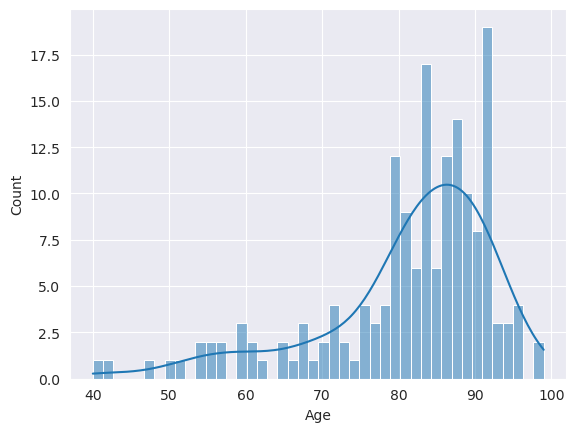

In [41]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

sns.histplot(x = final['Age'], kde = True,bins=44)


<AxesSubplot:xlabel='Nurse costs', ylabel='Count'>

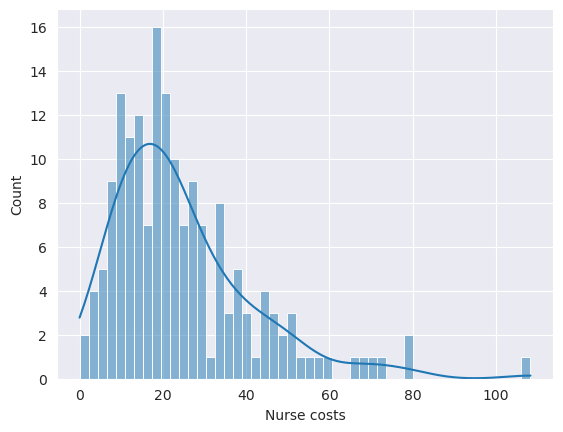

In [42]:


import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


sns.histplot(x = final['Nurse costs'], kde = True,bins=50)

<AxesSubplot:xlabel='Dressing costs', ylabel='Count'>

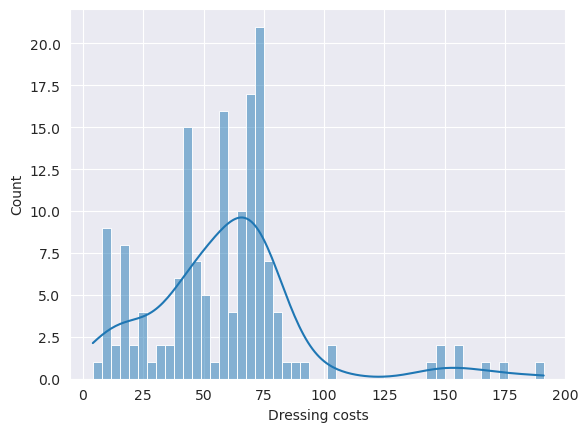

In [43]:

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

sns.histplot(x = final['Dressing costs'], kde = True,bins=50)

<AxesSubplot:xlabel='Material costs', ylabel='Count'>

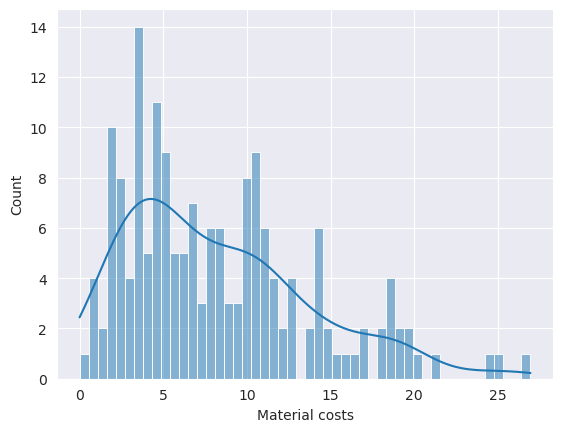

In [44]:

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

sns.histplot(x = final['Material costs'], kde = True,bins=50)

<AxesSubplot:xlabel='Total costs', ylabel='Count'>

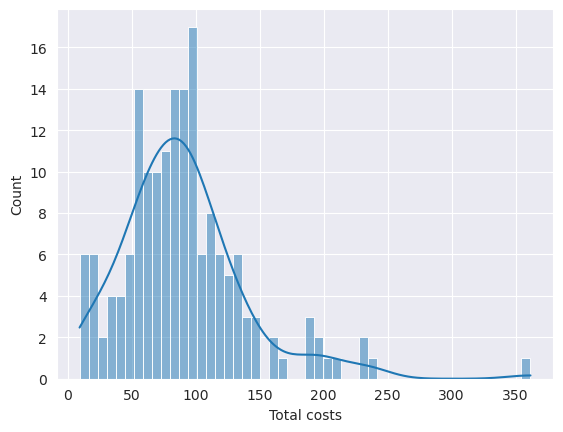

In [45]:

import numpy as np
import matplotlib.pyplot as plt

sns.histplot(x = final['Total costs'], kde = True,bins=50)

In [46]:
final.columns

Index(['ID CODE', 'Sex', 'Age', 'Baseline visit', 'num. visit',
       'Dressing type_x', 'Ulcer_stage', 'Cured: 1, no cured: 2', 'infected',
       'Postural changes', 'red_friccion', 'Avoided_infecion', 'Braden Scale',
       'Push Scale', 'porc_postural changes', 'porc_friccion', 'porc_infec',
       'Loss to follow up', 'Location', 'Nurse costs', 'Dressing costs',
       'Material costs', 'Secondary costs', 'Total costs', 'Dressing type_y'],
      dtype='object')

In [47]:
import seaborn as sns


<AxesSubplot:xlabel='Age'>

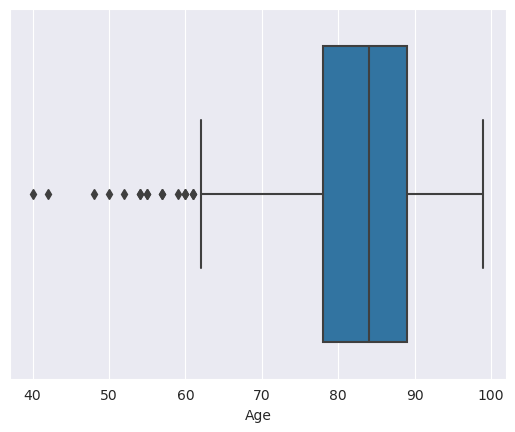

In [48]:
sns.boxplot(x=df['Age'])

<AxesSubplot:xlabel='Postural changes'>

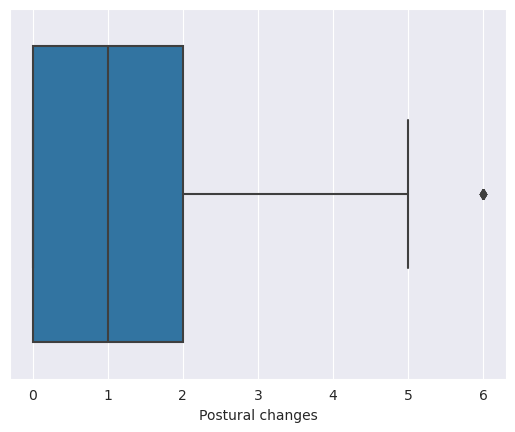

In [49]:
sns.boxplot(x=df['Postural changes'])

<AxesSubplot:xlabel='red_friccion'>

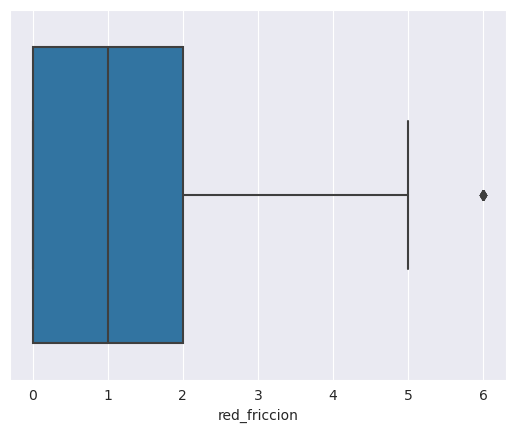

In [50]:
sns.boxplot(x=df['red_friccion'])

<AxesSubplot:xlabel='Avoided_infecion'>

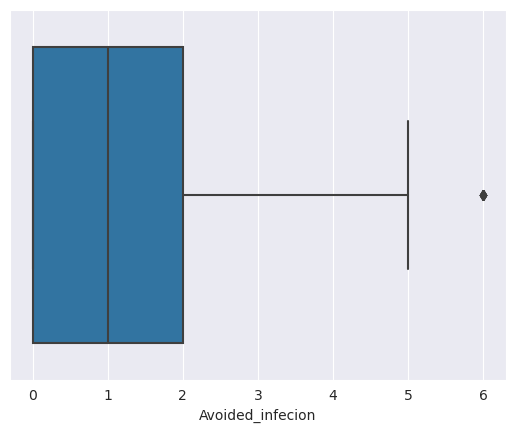

In [51]:
sns.boxplot(x=df['Avoided_infecion'])

<AxesSubplot:xlabel='Push Scale'>

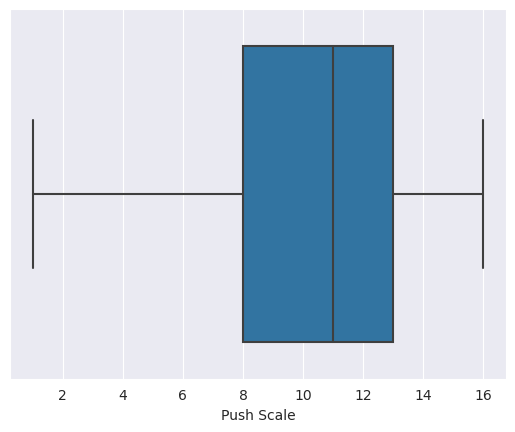

In [52]:
sns.boxplot(x=df['Push Scale'])

<AxesSubplot:xlabel='Nurse costs'>

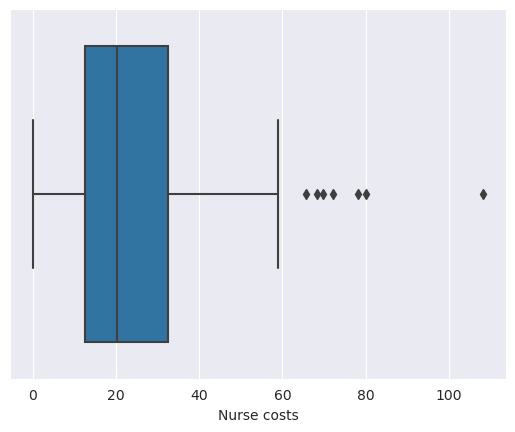

In [53]:
sns.boxplot(x=df['Nurse costs'])

<AxesSubplot:xlabel='Dressing costs'>

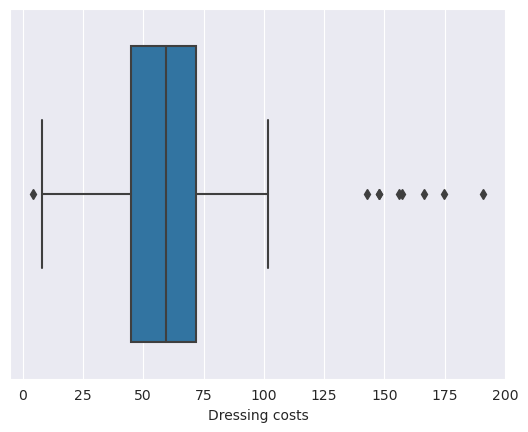

In [54]:
sns.boxplot(x=df['Dressing costs'])

<AxesSubplot:xlabel='Material costs'>

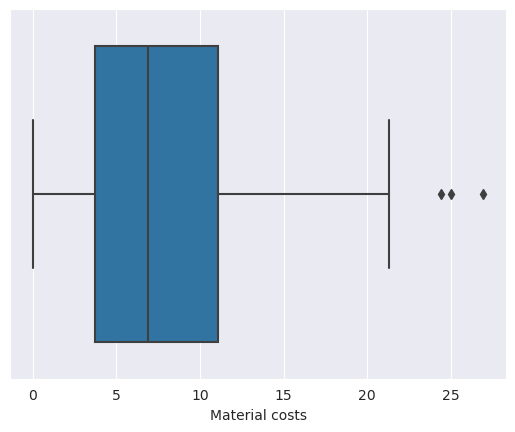

In [55]:
sns.boxplot(x=df['Material costs'])

<AxesSubplot:xlabel='Secondary costs'>

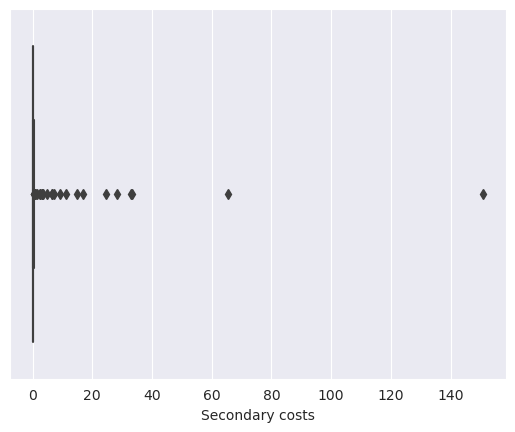

In [56]:

sns.boxplot(x=df['Secondary costs'])

<AxesSubplot:xlabel='Total costs'>

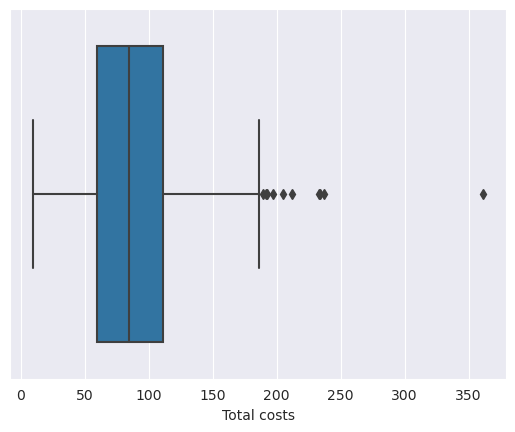

In [57]:
sns.boxplot(x=df['Total costs'])

/tmp/ipykernel_11824/2372390882.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<AxesSubplot:>

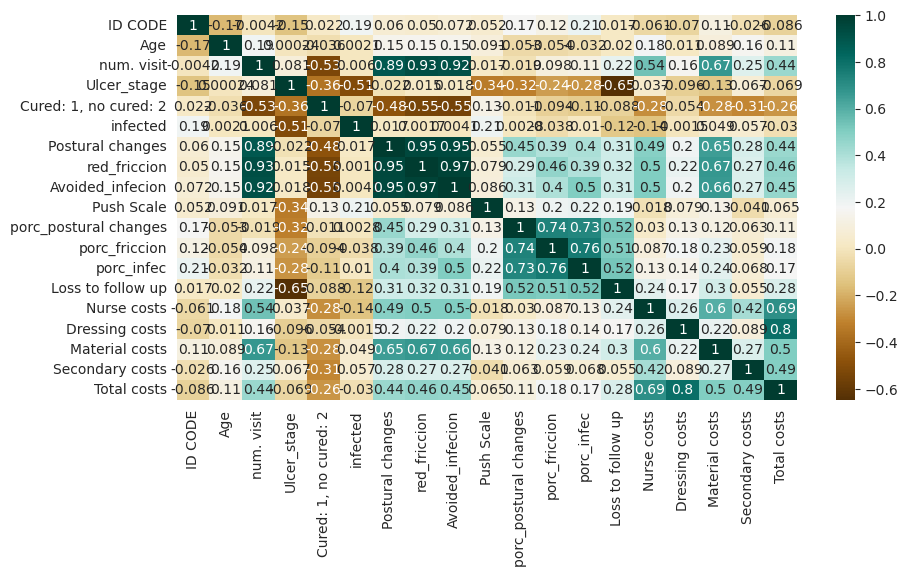

In [58]:

plt.figure(figsize=(10,5))
c= final.corr()
sns.heatmap(c,cmap="BrBG",annot=True)


In [59]:
co =pd.read_csv(rf'{path}corr.csv')

In [60]:

co

,Unnamed: 0,ID CODE,Age,num. visit,Ulcer_stage,"Cured: 1, no cured: 2",infected,Postural changes,red_friccion,Avoided_infecion,Push Scale,porc_postural changes,porc_friccion,porc_infec,Loss to follow up,Nurse costs,Dressing costs,Material costs,Secondary costs,Total costs
0,ID CODE,1.000000,-0.174470,-0.004225,-0.146285,0.021799,0.191889,0.060009,0.049550,0.072389,0.052111,0.172304,0.121079,0.208879,0.017232,-0.060996,-0.069750,0.109691,-0.025973,-0.086195
1,Age,-0.174470,1.000000,0.189912,0.000242,-0.036248,0.002146,0.145285,0.150040,0.146977,0.091011,-0.052958,-0.054291,-0.031511,0.020355,0.182690,0.010932,0.089233,0.156317,0.108755
2,num. visit,-0.004225,0.189912,1.000000,0.080583,-0.531966,0.005959,0.886517,0.925722,0.915315,0.017148,-0.018876,0.097904,0.114984,0.224997,0.541034,0.161054,0.665523,0.254299,0.441655
3,Ulcer_stage,-0.146285,0.000242,0.080583,1.000000,-0.364507,-0.510339,-0.022232,0.014972,0.018409,-0.339288,-0.324254,-0.244062,-0.275149,-0.649025,0.036513,-0.095970,-0.132449,0.066682,-0.068878
4,"Cured: 1, no cured: 2",0.021799,-0.036248,-0.531966,-0.364507,1.000000,-0.069569,-0.481021,-0.545095,-0.552174,0.126232,-0.011401,-0.093857,-0.112255,-0.088475,-0.283644,-0.054066,-0.279173,-0.305648,-0.264937
5,infected,0.191889,0.002146,0.005959,-0.510339,-0.069569,1.000000,0.017433,0.001694,0.004096,0.206946,0.002787,-0.037665,0.009960,-0.123872,-0.140538,-0.001535,0.049372,0.057392,-0.029909
6,Postural changes,0.060009,0.145285,0.886517,-0.022232,-0.481021,0.017433,1.000000,0.948978,0.947580,0.054596,0.447991,0.388259,0.401128,0.312307,0.488838,0.196356,0.646973,0.280937,0.444796
7,red_friccion,0.049550,0.150040,0.925722,0.014972,-0.545095,0.001694,0.948978,1.000000,0.972255,0.079318,0.292359,0.463047,0.392963,0.316750,0.501172,0.217898,0.665965,0.269798,0.463043
8,Avoided_infecion,0.072389,0.146977,0.915315,0.018409,-0.552174,0.004096,0.947580,0.972255,1.000000,0.086350,0.314039,0.396435,0.499515,0.314682,0.501537,0.200480,0.660150,0.269206,0.452968
9,Push Scale,0.052111,0.091011,0.017148,-0.339288,0.126232,0.206946,0.054596,0.079318,0.086350,1.000000,0.126326,0.202515,0.220167,0.190593,-0.018211,0.078927,0.126202,-0.040707,0.065090


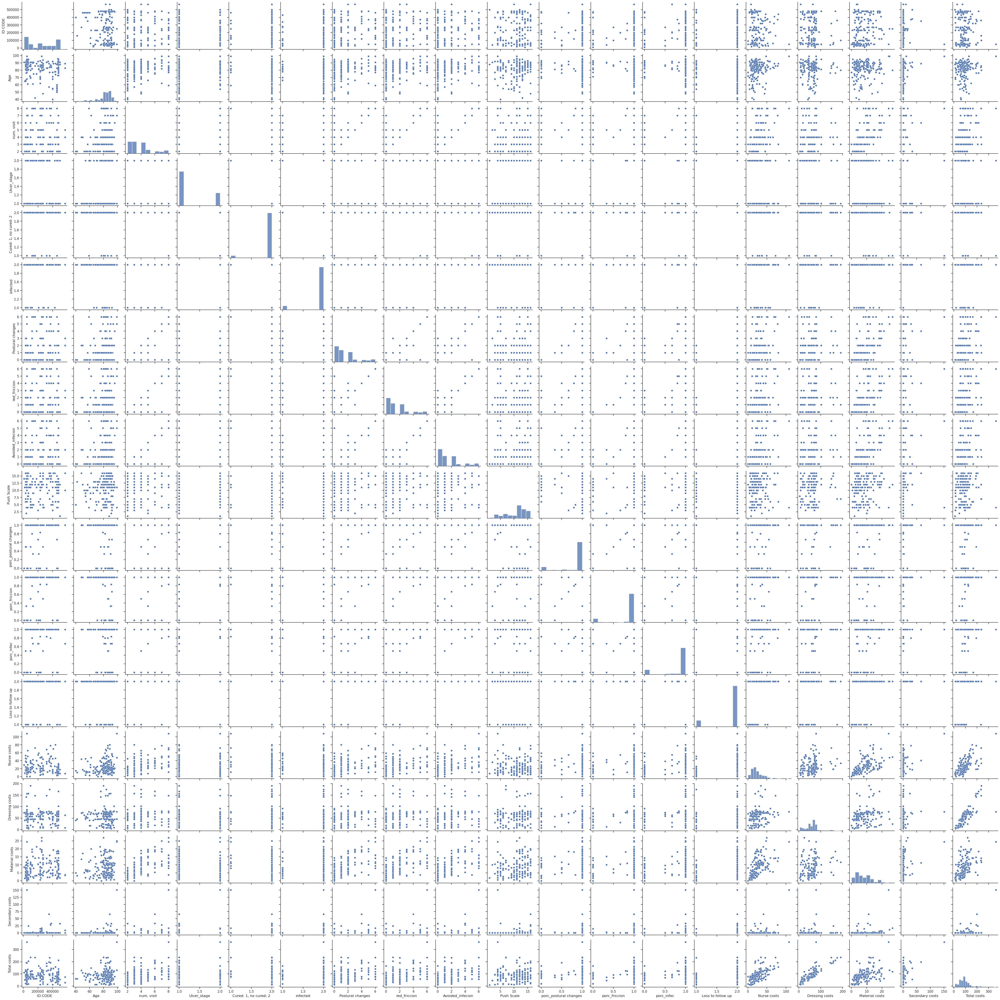

In [61]:
import seaborn as sns

import matplotlib.pyplot as plt


sns.set(style="ticks", color_codes=True)
g = sns.pairplot(final)

plt.show()


In [62]:
cat_cols=final.select_dtypes(include=['object']).columns
num_cols = final.select_dtypes(include=np.number).columns.tolist()
print("Categorical Variables:")
print(cat_cols)
print("Numerical Variables:")
print(num_cols)

Categorical Variables:
Index(['Sex', 'Dressing type_x', 'Braden Scale', 'Location',
       'Dressing type_y'],
      dtype='object')
Numerical Variables:
['ID CODE', 'Age', 'num. visit', 'Ulcer_stage', 'Cured: 1, no cured: 2', 'infected', 'Postural changes', 'red_friccion', 'Avoided_infecion', 'Push Scale', 'porc_postural changes', 'porc_friccion', 'porc_infec', 'Loss to follow up', 'Nurse costs', 'Dressing costs', 'Material costs', 'Secondary costs', 'Total costs']


ID CODE
Skew : 0.14


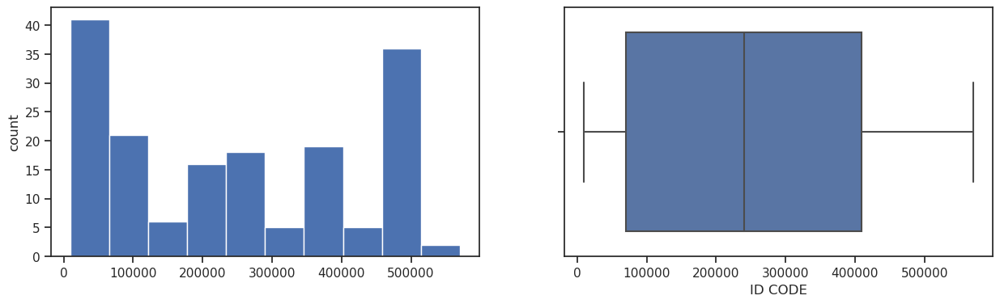

Age
Skew : -1.41


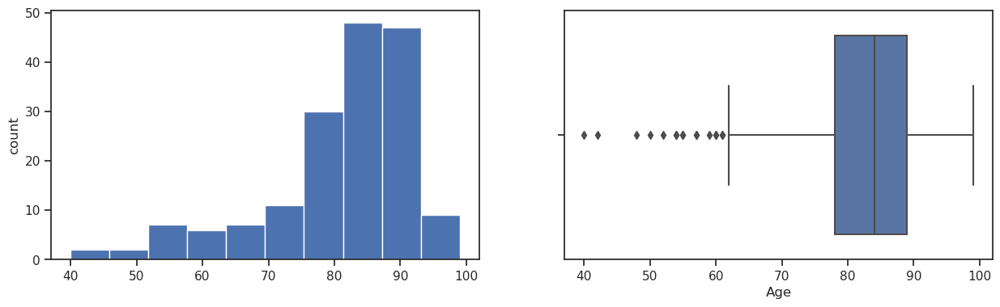

num. visit
Skew : 1.02


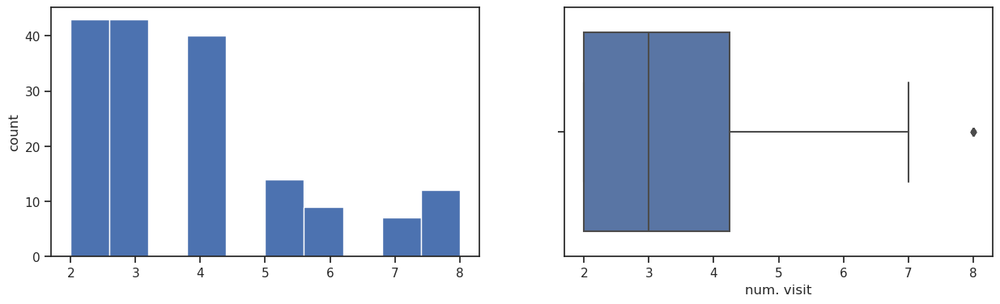

Ulcer_stage
Skew : 1.03


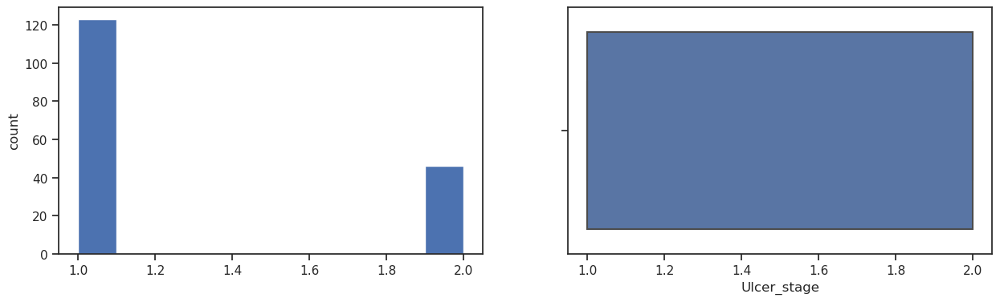

Cured: 1, no cured: 2
Skew : -4.3


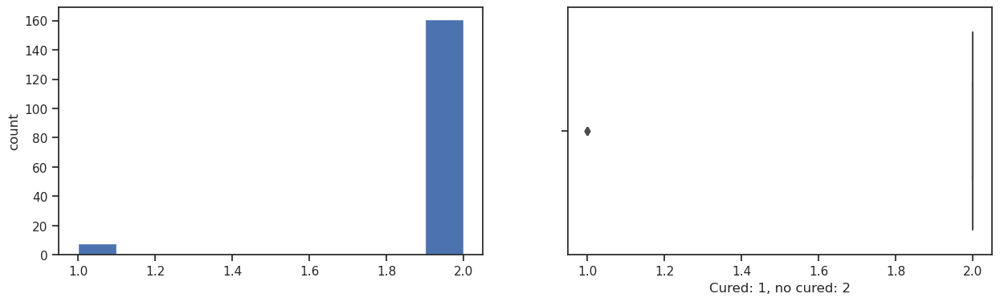

infected
Skew : -2.92


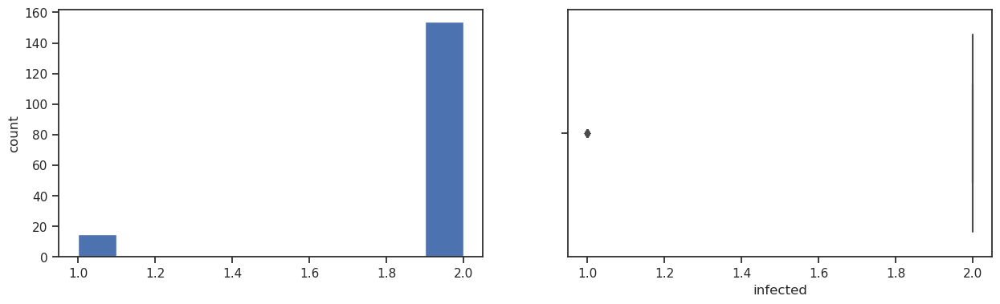

Postural changes
Skew : 1.24


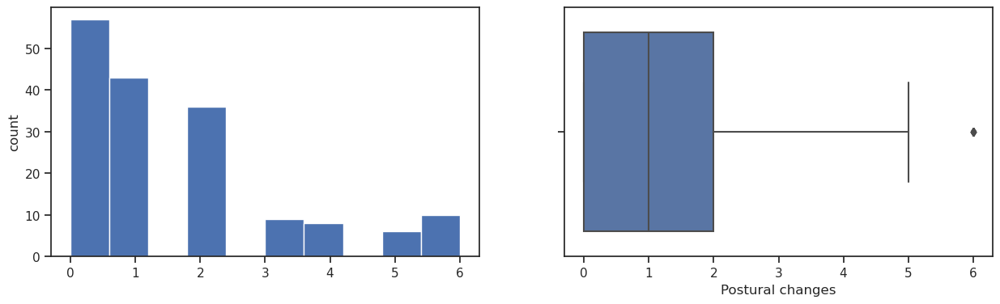

red_friccion
Skew : 1.15


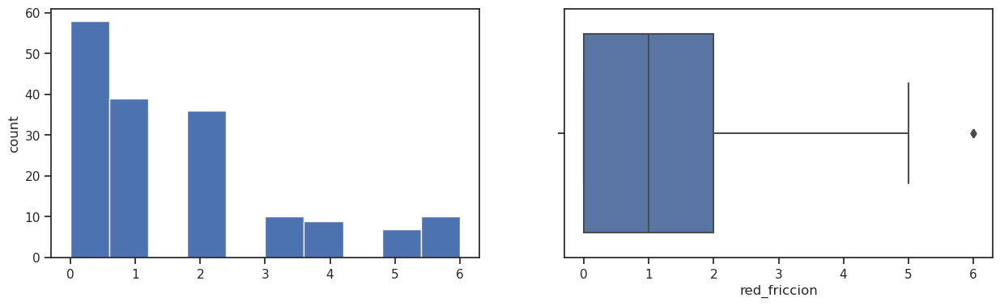

Avoided_infecion
Skew : 1.19


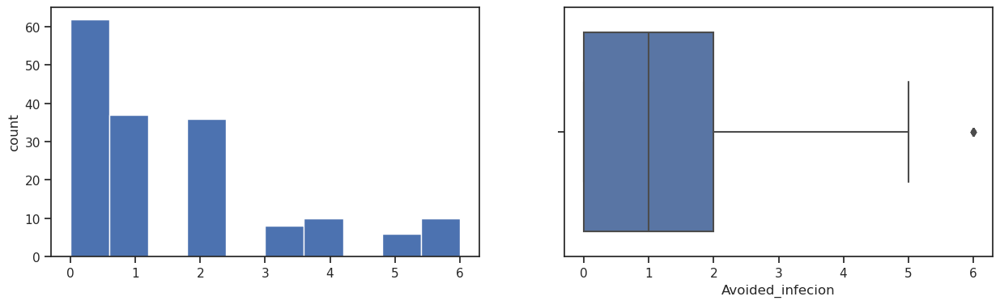

Push Scale
Skew : -0.56


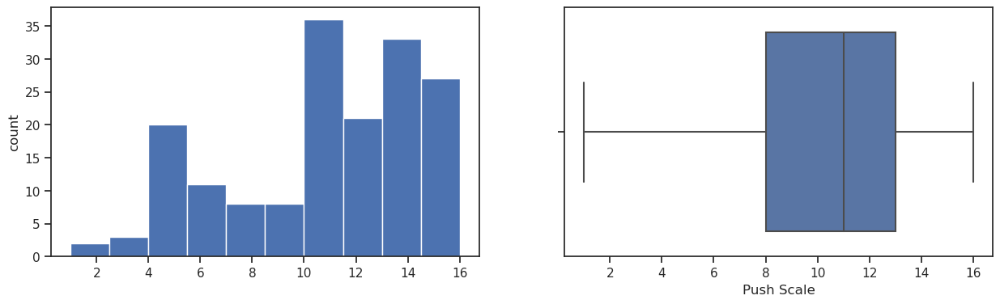

porc_postural changes
Skew : -2.11


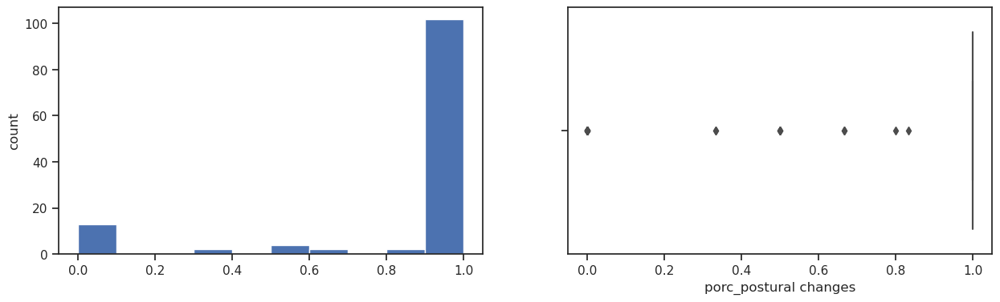

porc_friccion
Skew : -2.14


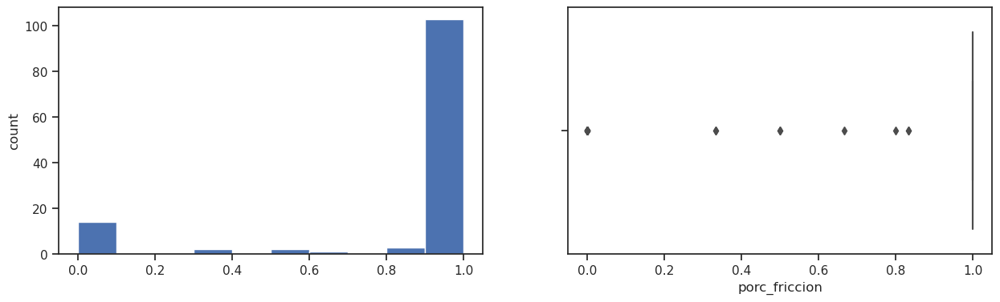

porc_infec
Skew : -1.8


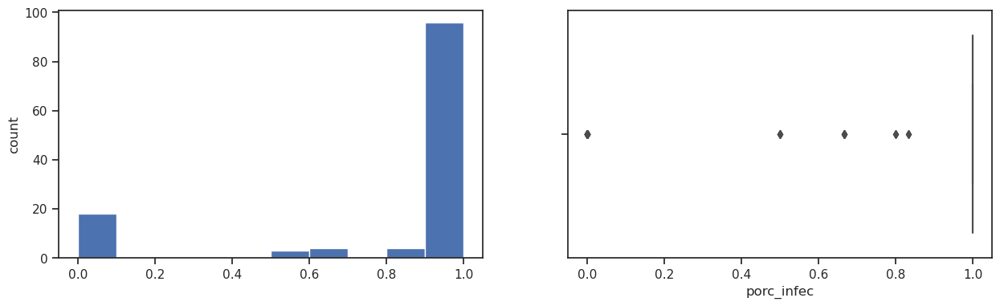

Loss to follow up
Skew : -2.14


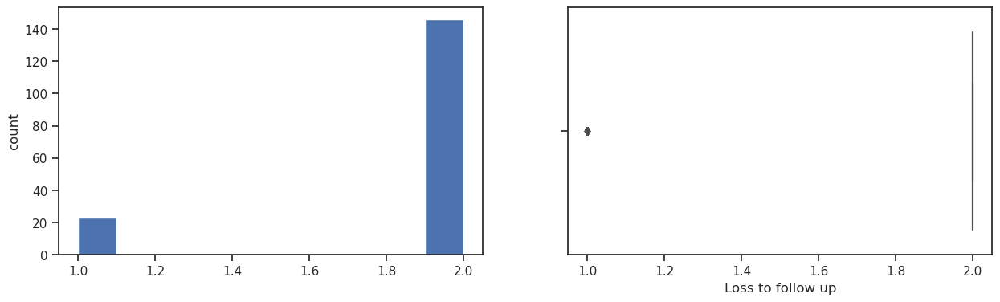

Nurse costs


KeyError: 'Nurse costs'

In [63]:
for col in num_cols:
    print(col)
    print('Skew :', round(data[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    data[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=data[col])
    plt.show()


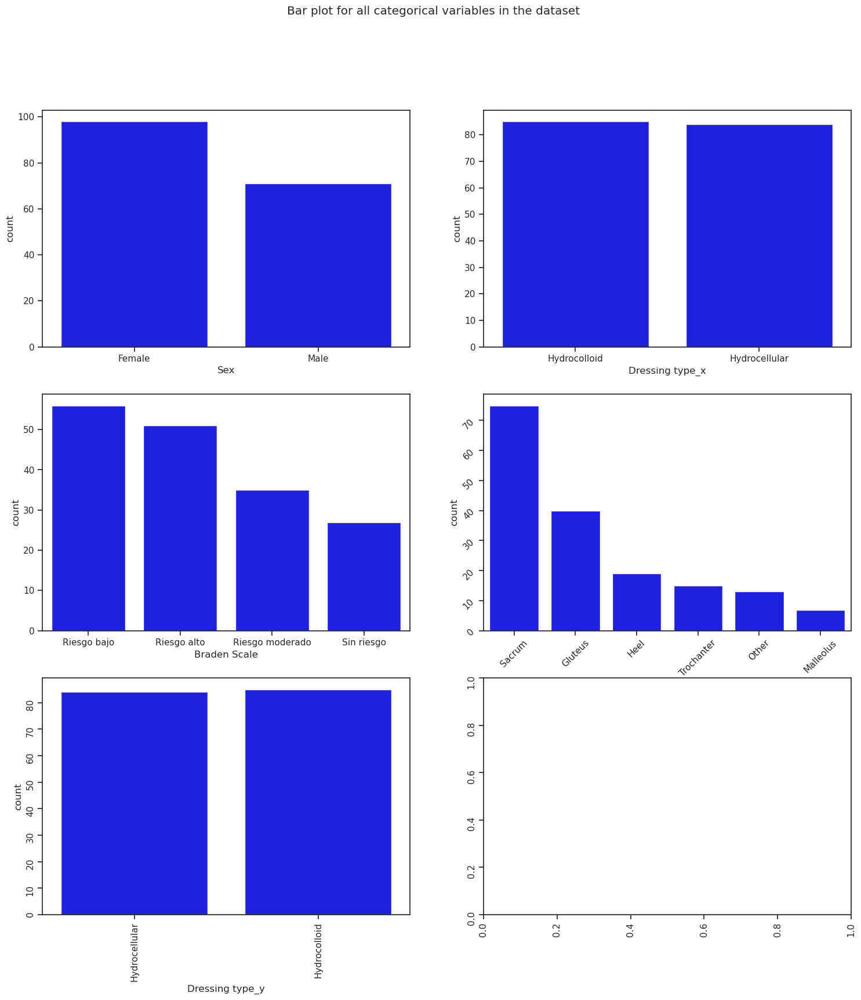

In [64]:
fig, axes = plt.subplots(3, 2, figsize = (18, 18))
fig.suptitle('Bar plot for all categorical variables in the dataset')
sns.countplot(ax = axes[0, 0], x = 'Sex', data = final, color = 'blue', 
              order = final['Sex'].value_counts().index);
sns.countplot(ax = axes[0, 1], x = 'Dressing type_x', data = final, color = 'blue', 
              order = final['Dressing type_x'].value_counts().index);
sns.countplot(ax = axes[1, 0], x = 'Braden Scale', data = final, color = 'blue', 
              order = final['Braden Scale'].value_counts().index);
sns.countplot(ax = axes[1, 1], x = 'Location', data = final, color = 'blue', 
              order = final['Location'].value_counts().index);
sns.countplot(ax = axes[2, 0], x = 'Dressing type_y', data = final, color = 'blue', 
              order = final['Dressing type_y'].head(20).value_counts().index);

axes[1][1].tick_params(labelrotation=45);
axes[2][0].tick_params(labelrotation=90);
axes[2][1].tick_params(labelrotation=90);

In [65]:
final['Total costs'].min()

9.408

In [66]:
final['Total costs'].max()

361.60116

In [67]:
final[final['Total costs'] == final['Total costs'].max()]

,ID CODE,Sex,Age,Baseline visit,num. visit,Dressing type_x,Ulcer_stage,"Cured: 1, no cured: 2",infected,Postural changes,red_friccion,Avoided_infecion,Braden Scale,Push Scale,porc_postural changes,porc_friccion,porc_infec,Loss to follow up,Location,Nurse costs,Dressing costs,Material costs,Secondary costs,Total costs,Dressing type_y
25,50016,Female,99,2015-08-12,8.0,Hydrocolloid,2,1,2,6,6,6,Riesgo bajo,4,1.0,1.0,1.0,2,Heel,108.275,77.9,24.42616,151.0,361.60116,Hydrocolloid


In [68]:
final[final['Total costs'] == final['Total costs'].min()]

,ID CODE,Sex,Age,Baseline visit,num. visit,Dressing type_x,Ulcer_stage,"Cured: 1, no cured: 2",infected,Postural changes,red_friccion,Avoided_infecion,Braden Scale,Push Scale,porc_postural changes,porc_friccion,porc_infec,Loss to follow up,Location,Nurse costs,Dressing costs,Material costs,Secondary costs,Total costs,Dressing type_y
94,500001,Male,88,2014-09-10,2.0,Hydrocellular,2,2,2,0,0,0,Riesgo alto,1,NaN,NaN,NaN,1,Sacrum,7.5,NaN,1.908,0.0,9.408,Hydrocellular


In [69]:
final[final['Nurse costs'] == final['Nurse costs'].max()]

,ID CODE,Sex,Age,Baseline visit,num. visit,Dressing type_x,Ulcer_stage,"Cured: 1, no cured: 2",infected,Postural changes,red_friccion,Avoided_infecion,Braden Scale,Push Scale,porc_postural changes,porc_friccion,porc_infec,Loss to follow up,Location,Nurse costs,Dressing costs,Material costs,Secondary costs,Total costs,Dressing type_y
25,50016,Female,99,2015-08-12,8.0,Hydrocolloid,2,1,2,6,6,6,Riesgo bajo,4,1.0,1.0,1.0,2,Heel,108.275,77.9,24.42616,151.0,361.60116,Hydrocolloid


In [70]:
final[final['Nurse costs'] == final['Nurse costs'].min()]

,ID CODE,Sex,Age,Baseline visit,num. visit,Dressing type_x,Ulcer_stage,"Cured: 1, no cured: 2",infected,Postural changes,red_friccion,Avoided_infecion,Braden Scale,Push Scale,porc_postural changes,porc_friccion,porc_infec,Loss to follow up,Location,Nurse costs,Dressing costs,Material costs,Secondary costs,Total costs,Dressing type_y
20,50002,Female,77,2013-10-07,3.0,Hydrocolloid,2,2,2,0,0,0,Riesgo alto,12,0.0,0.0,0.0,1,Heel,0.0,18.48,0.000,0.00,18.480,Hydrocolloid
127,90001,Male,72,2014-04-14,3.0,Hydrocolloid,1,2,2,1,1,1,Riesgo bajo,12,1.0,1.0,1.0,2,Malleolus,0.0,69.70,8.048,0.36,78.108,Hydrocolloid


In [71]:
final[final['Dressing costs'] == final['Dressing costs'].max()]

,ID CODE,Sex,Age,Baseline visit,num. visit,Dressing type_x,Ulcer_stage,"Cured: 1, no cured: 2",infected,Postural changes,red_friccion,Avoided_infecion,Braden Scale,Push Scale,porc_postural changes,porc_friccion,porc_infec,Loss to follow up,Location,Nurse costs,Dressing costs,Material costs,Secondary costs,Total costs,Dressing type_y
114,100002,Male,80,2013-09-10,3.0,Hydrocellular,1,2,2,1,1,1,Sin riesgo,7,1.0,1.0,1.0,2,Other,33.75,191.08,11.592,0.6,237.022,Hydrocellular


In [72]:
final[final['Dressing costs'] == final['Dressing costs'].min()]

,ID CODE,Sex,Age,Baseline visit,num. visit,Dressing type_x,Ulcer_stage,"Cured: 1, no cured: 2",infected,Postural changes,red_friccion,Avoided_infecion,Braden Scale,Push Scale,porc_postural changes,porc_friccion,porc_infec,Loss to follow up,Location,Nurse costs,Dressing costs,Material costs,Secondary costs,Total costs,Dressing type_y
13,70001,Male,91,2013-09-25,2.0,Hydrocolloid,2,2,2,0,0,0,Riesgo moderado,8,NaN,NaN,NaN,1,Trochanter,10.0,4.1,1.784,0.0,15.884,Hydrocolloid


In [73]:

final[final['Material costs'] == final[ 'Material costs'].max()]

,ID CODE,Sex,Age,Baseline visit,num. visit,Dressing type_x,Ulcer_stage,"Cured: 1, no cured: 2",infected,Postural changes,red_friccion,Avoided_infecion,Braden Scale,Push Scale,porc_postural changes,porc_friccion,porc_infec,Loss to follow up,Location,Nurse costs,Dressing costs,Material costs,Secondary costs,Total costs,Dressing type_y
66,250004,Female,80,2014-11-03,8.0,Hydrocolloid,2,1,2,6,6,6,Riesgo alto,12,1.0,1.0,1.0,2,Sacrum,49.3,24.6,26.94416,17.01,117.85416,Hydrocolloid


In [74]:

final[final['Material costs'] == final[ 'Material costs'].min()]

,ID CODE,Sex,Age,Baseline visit,num. visit,Dressing type_x,Ulcer_stage,"Cured: 1, no cured: 2",infected,Postural changes,red_friccion,Avoided_infecion,Braden Scale,Push Scale,porc_postural changes,porc_friccion,porc_infec,Loss to follow up,Location,Nurse costs,Dressing costs,Material costs,Secondary costs,Total costs,Dressing type_y
20,50002,Female,77,2013-10-07,3.0,Hydrocolloid,2,2,2,0,0,0,Riesgo alto,12,0.0,0.0,0.0,1,Heel,0.0,18.48,0.0,0.0,18.48,Hydrocolloid


In [75]:

final[final[ 'Secondary costs'] == final[ 'Secondary costs'].max()]

,ID CODE,Sex,Age,Baseline visit,num. visit,Dressing type_x,Ulcer_stage,"Cured: 1, no cured: 2",infected,Postural changes,red_friccion,Avoided_infecion,Braden Scale,Push Scale,porc_postural changes,porc_friccion,porc_infec,Loss to follow up,Location,Nurse costs,Dressing costs,Material costs,Secondary costs,Total costs,Dressing type_y
25,50016,Female,99,2015-08-12,8.0,Hydrocolloid,2,1,2,6,6,6,Riesgo bajo,4,1.0,1.0,1.0,2,Heel,108.275,77.9,24.42616,151.0,361.60116,Hydrocolloid


In [76]:

final[final[ 'Secondary costs'] == final[ 'Secondary costs'].min()]

,ID CODE,Sex,Age,Baseline visit,num. visit,Dressing type_x,Ulcer_stage,"Cured: 1, no cured: 2",infected,Postural changes,red_friccion,Avoided_infecion,Braden Scale,Push Scale,porc_postural changes,porc_friccion,porc_infec,Loss to follow up,Location,Nurse costs,Dressing costs,Material costs,Secondary costs,Total costs,Dressing type_y
0,270009,Female,86,2015-09-11,2.0,Hydrocellular,1,2,2,0,0,0,Riesgo moderado,15,NaN,NaN,NaN,2,Trochanter,5.000000,46.53,3.36800,0.0,54.898000,Hydrocellular
1,470003,Female,92,2014-09-19,2.0,Hydrocellular,2,2,2,0,0,0,Riesgo moderado,4,NaN,NaN,NaN,1,Trochanter,3.645833,40.92,2.00400,0.0,46.569833,Hydrocellular
2,30006,Female,88,2014-06-03,2.0,Hydrocolloid,2,2,1,0,0,0,Riesgo moderado,6,NaN,NaN,NaN,2,Trochanter,18.750000,57.40,1.68200,0.0,77.832000,Hydrocolloid
3,100005,Female,91,2014-03-11,3.0,Hydrocolloid,1,2,2,1,1,1,Riesgo moderado,12,1.000000,1.000000,1.000000,2,Trochanter,10.750000,45.10,2.68000,0.0,58.530000,Hydrocolloid
5,210001,Female,82,2014-05-21,4.0,Hydrocolloid,2,2,1,0,0,0,Riesgo moderado,6,0.000000,0.000000,0.000000,2,Trochanter,59.000000,92.28,14.34472,0.0,165.624720,Hydrocolloid
6,270004,Female,80,2014-08-06,2.0,Hydrocolloid,2,2,1,0,0,0,Riesgo alto,4,NaN,NaN,NaN,2,Trochanter,7.000000,8.20,3.30000,0.0,18.500000,Hydrocolloid
7,270006,Female,94,2014-08-14,4.0,Hydrocolloid,1,2,2,2,2,2,Riesgo bajo,5,1.000000,1.000000,1.000000,2,Trochanter,26.250000,77.90,11.25200,0.0,115.402000,Hydrocolloid
9,20001,Male,65,2014-06-24,2.0,Hydrocellular,1,2,2,0,0,0,Riesgo alto,11,NaN,NaN,NaN,2,Trochanter,8.750000,40.92,1.57400,0.0,51.244000,Hydrocellular
10,30008,Male,66,2014-12-22,5.0,Hydrocellular,2,2,1,3,3,3,Riesgo alto,13,1.000000,1.000000,1.000000,2,Trochanter,24.250000,67.68,3.04800,0.0,94.978000,Hydrocellular
11,230009,Male,79,2015-02-25,8.0,Hydrocellular,1,2,2,5,5,5,Riesgo moderado,5,0.833333,0.833333,0.833333,2,Trochanter,10.750000,80.37,3.72600,0.0,94.846000,Hydrocellular


In [77]:
pd.set_option("display.max_rows", None)
import numpy as np
from IPython.display import HTML, display
import tabulate
import matplotlib.pyplot as plt

#"Accuracy","F1Scores","Precision", "Recall","Precision class 1", "Recall class 1","Precision class 0", "Recall class 0"
table = [["Total costs",9.408,361.60116],
         ["Nurse costs",0.0,108.275],
         ["Dressing costs",4.1,191.08],
         ["Material costs",0.0,26.94416],
         ["Secondary costs",0.0,151.0]
        ]

display(HTML('<h1>Cost</h1> '))
display(HTML(tabulate.tabulate(table, headers=["Cost","Min","Max"], tablefmt='html')))

Cost,Min,Max
Total costs,9.408,361.601
Nurse costs,0,108.275
Dressing costs,4.1,191.08
Material costs,0,26.9442
Secondary costs,0,151


In [78]:
#final.to_csv(rf'{path}final.csv')

In [79]:
final['Dressing type_x'].value_counts()

Hydrocolloid     85
Hydrocellular    84
Name: Dressing type_x, dtype: int64

In [80]:
final.columns

Index(['ID CODE', 'Sex', 'Age', 'Baseline visit', 'num. visit',
       'Dressing type_x', 'Ulcer_stage', 'Cured: 1, no cured: 2', 'infected',
       'Postural changes', 'red_friccion', 'Avoided_infecion', 'Braden Scale',
       'Push Scale', 'porc_postural changes', 'porc_friccion', 'porc_infec',
       'Loss to follow up', 'Location', 'Nurse costs', 'Dressing costs',
       'Material costs', 'Secondary costs', 'Total costs', 'Dressing type_y'],
      dtype='object')

In [81]:
# put all both dressing in comparing in table

In [82]:
print("Hydrocolloid Total costs",final[final['Dressing type_x'] == 'Hydrocolloid']['Total costs'].sum())
print("Hydrocellular Total costs",final[final['Dressing type_x'] == 'Hydrocellular']['Total costs'].sum())

Hydrocolloid Total costs 7956.393146666657
Hydrocellular Total costs 7316.701099999998


In [83]:
print("Hydrocolloid Nurse costss",final[final['Dressing type_x'] == 'Hydrocolloid']['Nurse costs'].sum())
print("Hydrocellular Nurse costs",final[final['Dressing type_x'] == 'Hydrocellular']['Nurse costs'].sum())

Hydrocolloid Nurse costss 2186.3666666666663
Hydrocellular Nurse costs 1967.2374999999997


In [84]:
print("Hydrocolloid Dressing costs",final[final['Dressing type_x'] == 'Hydrocolloid']['Dressing costs'].sum())
print("Hydrocellular Dressing costs",final[final['Dressing type_x'] == 'Hydrocellular']['Dressing costs'].sum())

Hydrocolloid Dressing costs 4711.779999999994
Hydrocellular Dressing costs 4571.450000000001


In [85]:
print("Hydrocolloid Material costs",final[final['Dressing type_x'] == 'Hydrocolloid']['Material costs'].sum())
print("Hydrocellular Material costs",final[final['Dressing type_x'] == 'Hydrocellular']['Material costs'].sum())

Hydrocolloid Material costs 753.4514799999998
Hydrocellular Material costs 641.5086


In [86]:
pd.set_option("display.max_rows", None)
import numpy as np
from IPython.display import HTML, display
import tabulate
import matplotlib.pyplot as plt

#"Accuracy","F1Scores","Precision", "Recall","Precision class 1", "Recall class 1","Precision class 0", "Recall class 0"
table = [["Total costs",7956.393146666657,7316.701099999998],
         ["Nurse costs",2186.3666666666663,1967.2374999999997],
         ["Dressing costs",4711.779999999994,4571.450000000001],
         ["Material costs",753.4514799999998,641.5086],
         ["Secondary costs",304.795,136.50499999999985],

        ]

display(HTML('<h1>Cost</h1> '))
display(HTML(tabulate.tabulate(table, headers=["Cost","Hydrocolloid","Hydrocellular"], tablefmt='html')))

Cost,Hydrocolloid,Hydrocellular
Total costs,7956.39,7316.7
Nurse costs,2186.37,1967.24
Dressing costs,4711.78,4571.45
Material costs,753.451,641.509
Secondary costs,304.795,136.505


In [87]:
#no
print(final[final['Dressing type_x'] == 'Hydrocolloid']['Location'].value_counts())
print("****************************************************************************")
print(final[final['Dressing type_x'] == 'Hydrocellular']['Location'].value_counts())

Sacrum        37
Gluteus       19
Heel          13
Trochanter     9
Other          4
Malleolus      3
Name: Location, dtype: int64
****************************************************************************
Sacrum        38
Gluteus       21
Other          9
Trochanter     6
Heel           6
Malleolus      4
Name: Location, dtype: int64


In [88]:
pd.set_option("display.max_rows", None)
import numpy as np
from IPython.display import HTML, display
import tabulate
import matplotlib.pyplot as plt

#"Accuracy","F1Scores","Precision", "Recall","Precision class 1", "Recall class 1","Precision class 0", "Recall class 0"
table = [["Sacrum",37,38],
         ["Gluteus",19,21],
         ["Heel",13,6],
         ["Trochanter",9,6],
         ["Other",4,9],
        ["Malleolus",3,9],



        ]

display(HTML('<h1>Location</h1> '))
display(HTML(tabulate.tabulate(table, headers=["Location","Hydrocolloid","Hydrocellular"], tablefmt='html')))

Location,Hydrocolloid,Hydrocellular
Sacrum,37,38
Gluteus,19,21
Heel,13,6
Trochanter,9,6
Other,4,9
Malleolus,3,9


In [89]:
# 1 infeaction
# 2 no infeaction
print("infected")
print("Hydrocolloid")
print(final[final['Dressing type_x'] == 'Hydrocolloid']['infected'].value_counts())
print("****************************************************************************")
print("Hydrocellular")
print(final[final['Dressing type_x'] == 'Hydrocellular']['infected'].value_counts())

infected
Hydrocolloid
2    74
1    11
Name: infected, dtype: int64
****************************************************************************
Hydrocellular
2    80
1     4
Name: infected, dtype: int64


In [90]:
print("Postural changes")
print("Hydrocolloid")
print(final[final['Dressing type_x'] == 'Hydrocolloid']['Postural changes'].value_counts())
print("****************************************************************************")
print("Hydrocellular")
print(final[final['Dressing type_x'] == 'Hydrocellular']['Postural changes'].value_counts())

Postural changes
Hydrocolloid
0    25
2    21
1    20
6     6
4     6
3     4
5     3
Name: Postural changes, dtype: int64
****************************************************************************
Hydrocellular
0    32
1    23
2    15
3     5
6     4
5     3
4     2
Name: Postural changes, dtype: int64


In [91]:
pd.set_option("display.max_rows", None)
import numpy as np
from IPython.display import HTML, display
import tabulate
import matplotlib.pyplot as plt

#"Accuracy","F1Scores","Precision", "Recall","Precision class 1", "Recall class 1","Precision class 0", "Recall class 0"
table = [["0",25,32],
         ["1",20,23],
         ["2",21,15] ,
         ["3",4,5],  
         ["4",6,2]  ,
         ["5",3,3] , 
         ["6",6,4] , 




        ]

display(HTML('<h1>Postural changes</h1> '))
display(HTML(tabulate.tabulate(table, headers=["Postural changes","Hydrocolloid","Hydrocellular"], tablefmt='html')))

Postural changes,Hydrocolloid,Hydrocellular
0,25,32
1,20,23
2,21,15
3,4,5
4,6,2
5,3,3
6,6,4


In [92]:
print("red_friccion")
print("Hydrocolloid")
print(final[final['Dressing type_x'] == 'Hydrocolloid']['red_friccion'].value_counts())
print("****************************************************************************")
print("Hydrocellular")
print(final[final['Dressing type_x'] == 'Hydrocellular']['red_friccion'].value_counts())

red_friccion
Hydrocolloid
0    27
2    20
1    17
4     7
6     6
3     5
5     3
Name: red_friccion, dtype: int64
****************************************************************************
Hydrocellular
0    31
1    22
2    16
3     5
5     4
6     4
4     2
Name: red_friccion, dtype: int64


In [93]:
pd.set_option("display.max_rows", None)
import numpy as np
from IPython.display import HTML, display
import tabulate
import matplotlib.pyplot as plt

#"Accuracy","F1Scores","Precision", "Recall","Precision class 1", "Recall class 1","Precision class 0", "Recall class 0"
table = [["0",27,31],
         ["1",17,22],
         ["2",20,16] ,
         ["3",5,5],  
         ["4",7,2]  ,
         ["5",3,4] , 
         ["6",6,4] , 




        ]

display(HTML('<h1>red_friccion</h1> '))
display(HTML(tabulate.tabulate(table, headers=["red_friccion","Hydrocolloid","Hydrocellular"], tablefmt='html')))

red_friccion,Hydrocolloid,Hydrocellular
0,27,31
1,17,22
2,20,16
3,5,5
4,7,2
5,3,4
6,6,4


In [94]:
print("Avoided_infecion")
print("Hydrocolloid")
print(final[final['Dressing type_x'] == 'Hydrocolloid']['Avoided_infecion'].value_counts())
print("****************************************************************************")
print("Hydrocellular")
print(final[final['Dressing type_x'] == 'Hydrocellular']['Avoided_infecion'].value_counts())

Avoided_infecion
Hydrocolloid
0    30
2    19
1    15
4     8
6     6
3     5
5     2
Name: Avoided_infecion, dtype: int64
****************************************************************************
Hydrocellular
0    32
1    22
2    17
5     4
6     4
3     3
4     2
Name: Avoided_infecion, dtype: int64


In [95]:
pd.set_option("display.max_rows", None)
import numpy as np
from IPython.display import HTML, display
import tabulate
import matplotlib.pyplot as plt

#"Accuracy","F1Scores","Precision", "Recall","Precision class 1", "Recall class 1","Precision class 0", "Recall class 0"
table = [["0",30,32],
         ["1",15,22],
         ["2",19,17] ,
         ["3",5,3],  
         ["4",8,2]  ,
         ["5",2,4] , 
         ["6",6,4] , 




        ]

display(HTML('<h1>Avoided_infecion</h1> '))
display(HTML(tabulate.tabulate(table, headers=["Avoided_infecion","Hydrocolloid","Hydrocellular"], tablefmt='html')))

Avoided_infecion,Hydrocolloid,Hydrocellular
0,30,32
1,15,22
2,19,17
3,5,3
4,8,2
5,2,4
6,6,4


In [96]:
print("Braden Scale")
print("Hydrocolloid")
print(final[final['Dressing type_x'] == 'Hydrocolloid']['Braden Scale'].value_counts())
print("****************************************************************************")
print("Hydrocellular")
print(final[final['Dressing type_x'] == 'Hydrocellular']['Braden Scale'].value_counts())

Braden Scale
Hydrocolloid
Riesgo alto        28
Riesgo bajo        25
Riesgo moderado    19
Sin riesgo         13
Name: Braden Scale, dtype: int64
****************************************************************************
Hydrocellular
Riesgo bajo        31
Riesgo alto        23
Riesgo moderado    16
Sin riesgo         14
Name: Braden Scale, dtype: int64


In [97]:
pd.set_option("display.max_rows", None)
import numpy as np
from IPython.display import HTML, display
import tabulate
import matplotlib.pyplot as plt

#"Accuracy","F1Scores","Precision", "Recall","Precision class 1", "Recall class 1","Precision class 0", "Recall class 0"
table = [["Riesgo alto",28,23],
         ["Riesgo bajo",25,31],
         ["Riesgo moderado",19,16] ,
         ["Sin riesgo",13,14],  




        ]

display(HTML('<h1>Braden Scale</h1> '))
display(HTML(tabulate.tabulate(table, headers=["Braden Scale","Hydrocolloid","Hydrocellular"], tablefmt='html')))

Braden Scale,Hydrocolloid,Hydrocellular
Riesgo alto,28,23
Riesgo bajo,25,31
Riesgo moderado,19,16
Sin riesgo,13,14


In [98]:
print("Push Scale")
print("Hydrocolloid")
print(final[final['Dressing type_x'] == 'Hydrocolloid']['Push Scale'].value_counts())
print("****************************************************************************")
print("Hydrocellular")
print(final[final['Dressing type_x'] == 'Hydrocellular']['Push Scale'].value_counts())

Push Scale
Hydrocolloid
11    12
14    11
12    10
4      9
13     8
6      6
16     6
9      6
5      5
15     5
10     3
8      2
7      1
3      1
Name: Push Scale, dtype: int64
****************************************************************************
Hydrocellular
11    14
12    11
13    10
15     8
16     8
10     7
6      5
5      4
7      4
14     4
4      2
9      2
3      2
1      1
8      1
2      1
Name: Push Scale, dtype: int64


In [99]:
pd.set_option("display.max_rows", None)
import numpy as np
from IPython.display import HTML, display
import tabulate
import matplotlib.pyplot as plt

#"Accuracy","F1Scores","Precision", "Recall","Precision class 1", "Recall class 1","Precision class 0", "Recall class 0"
table = [["1",0,1],
         ["2",0,1,],
         ["3",1,2],
         ["4",9,2],
         ["5",5,4],
         ["6",6,5],
         ["7",1,4],
         ["8",2,1],
         ["9",6,2],
         ["10",3,7],
         ["11",12,14],
         ["12",10,11],
         ["13",8,10],
         ["14",11,4],
         ["15",5,8],
         ["16",6,8],

        ]

display(HTML('<h1>Push Scale</h1> '))
display(HTML(tabulate.tabulate(table, headers=["Push Scale","Hydrocolloid","Hydrocellular"], tablefmt='html')))

Push Scale,Hydrocolloid,Hydrocellular
1,0,1
2,0,1
3,1,2
4,9,2
5,5,4
6,6,5
7,1,4
8,2,1
9,6,2
10,3,7


In [100]:
print("porc_postural changes")
print("Hydrocolloid")
print(final[final['Dressing type_x'] == 'Hydrocolloid']['porc_postural changes'].value_counts())
print("****************************************************************************")
print("Hydrocellular")
print(final[final['Dressing type_x'] == 'Hydrocellular']['porc_postural changes'].value_counts())

porc_postural changes
Hydrocolloid
1.000000    54
0.000000     8
0.333333     2
0.666667     2
0.500000     1
0.800000     1
Name: porc_postural changes, dtype: int64
****************************************************************************
Hydrocellular
1.000000    48
0.000000     5
0.500000     3
0.833333     1
Name: porc_postural changes, dtype: int64


In [101]:
print("porc_friccion")
print("Hydrocolloid")
print(final[final['Dressing type_x'] == 'Hydrocolloid']['porc_friccion'].value_counts())
print("****************************************************************************")
print("Hydrocellular")
print(final[final['Dressing type_x'] == 'Hydrocellular']['porc_friccion'].value_counts())

porc_friccion
Hydrocolloid
1.000000    55
0.000000    10
0.800000     1
0.333333     1
0.666667     1
Name: porc_friccion, dtype: int64
****************************************************************************
Hydrocellular
1.000000    48
0.000000     4
0.833333     2
0.500000     2
0.333333     1
Name: porc_friccion, dtype: int64


In [102]:
print("porc_infec")
print("Hydrocolloid")
print(final[final['Dressing type_x'] == 'Hydrocolloid']['porc_infec'].value_counts())
print("****************************************************************************")
print("Hydrocellular")
print(final[final['Dressing type_x'] == 'Hydrocellular']['porc_infec'].value_counts())

porc_infec
Hydrocolloid
1.000000    49
0.000000    13
0.666667     3
0.800000     2
0.500000     1
Name: porc_infec, dtype: int64
****************************************************************************
Hydrocellular
1.000000    47
0.000000     5
0.833333     2
0.500000     2
0.666667     1
Name: porc_infec, dtype: int64


In [103]:
print(final[final['Dressing type_x'] == 'Hydrocolloid']['Nurse costs'].sum())
print("****************************************************************************")
print(final[final['Dressing type_x'] == 'Hydrocellular']['Nurse costs'].sum())

2186.3666666666663
****************************************************************************
1967.2374999999997


In [104]:
print(final[final['Dressing type_x'] == 'Hydrocolloid']['Dressing costs'].sum())
print("****************************************************************************")
print(final[final['Dressing type_x'] == 'Hydrocellular']['Dressing costs'].sum())

4711.779999999994
****************************************************************************
4571.450000000001


In [105]:
print(final[final['Dressing type_x'] == 'Hydrocolloid']['Material costs'].sum())
print("****************************************************************************")
print(final[final['Dressing type_x'] == 'Hydrocellular']['Material costs'].sum())

753.4514799999998
****************************************************************************
641.5086


In [106]:
print(final[final['Dressing type_x'] == 'Hydrocolloid']['Secondary costs'].sum())
print("****************************************************************************")
print(final[final['Dressing type_x'] == 'Hydrocellular']['Secondary costs'].sum())

304.795
****************************************************************************
136.50499999999985


In [107]:
print(final[final['Dressing type_x'] == 'Hydrocolloid']['Total costs'].sum())
print("****************************************************************************")
print(final[final['Dressing type_x'] == 'Hydrocellular']['Total costs'].sum())

7956.393146666657
****************************************************************************
7316.701099999998


In [108]:
print(final[final['Dressing type_x'] == 'Hydrocolloid']['Age'].value_counts())
print("****************************************************************************")
print(final[final['Dressing type_x'] == 'Hydrocellular']['Age'].value_counts())

81    7
86    6
91    6
90    6
84    6
83    5
82    4
80    4
89    4
85    3
92    3
71    3
93    3
88    3
75    2
70    2
87    2
99    2
76    1
72    1
94    1
69    1
55    1
62    1
59    1
65    1
96    1
74    1
78    1
77    1
95    1
68    1
Name: Age, dtype: int64
****************************************************************************
91    7
86    6
89    6
80    6
87    5
83    4
88    4
78    3
85    3
92    3
90    2
57    2
84    2
82    2
73    2
60    2
94    2
77    2
95    2
79    2
68    2
81    2
61    2
54    2
66    1
76    1
65    1
50    1
42    1
48    1
55    1
40    1
52    1
Name: Age, dtype: int64


<AxesSubplot:>

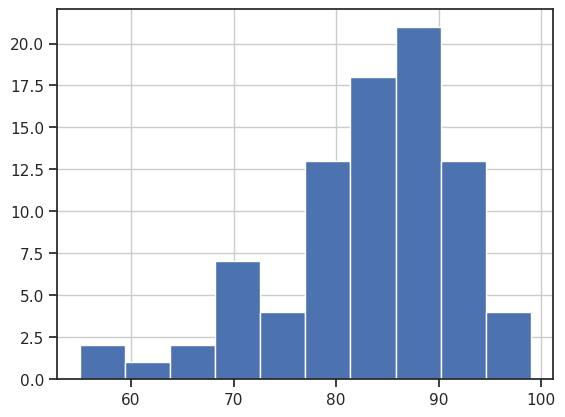

In [109]:
final[final['Dressing type_x'] == 'Hydrocolloid']['Age'].hist()

In [110]:
print(final[final['Dressing type_x'] == 'Hydrocolloid']['Sex'].value_counts())
print("****************************************************************************")
print(final[final['Dressing type_x'] == 'Hydrocellular']['Sex'].value_counts())

Female    53
Male      32
Name: Sex, dtype: int64
****************************************************************************
Female    45
Male      39
Name: Sex, dtype: int64


In [111]:
pd.set_option("display.max_rows", None)
import numpy as np
from IPython.display import HTML, display
import tabulate
import matplotlib.pyplot as plt

#"Accuracy","F1Scores","Precision", "Recall","Precision class 1", "Recall class 1","Precision class 0", "Recall class 0"
table = [["Female",53,45],
         ["Male",32,39],
        ]

display(HTML('<h1>Sex</h1> '))
display(HTML(tabulate.tabulate(table, headers=["Sex","Hydrocolloid","Hydrocellular"], tablefmt='html')))

Sex,Hydrocolloid,Hydrocellular
Female,53,45
Male,32,39


In [112]:
df_Hydrocellular=final[final['Dressing type_x'] == 'Hydrocellular'][['Sex','Postural changes']]
df_Hydrocellular.groupby('Sex').count()

,Postural changes
Sex,
Female,45
Male,39


In [113]:
df_Hydrocolloid=final[final['Dressing type_x'] == 'Hydrocolloid'][['Sex','Postural changes']]
df_Hydrocolloid.groupby('Sex').count()

,Postural changes
Sex,
Female,53
Male,32


In [114]:
pd.set_option("display.max_rows", None)
import numpy as np
from IPython.display import HTML, display
import tabulate
import matplotlib.pyplot as plt

#"Accuracy","F1Scores","Precision", "Recall","Precision class 1", "Recall class 1","Precision class 0", "Recall class 0"
table = [["Hydrocellular",45,39],
         ["Hydrocolloid",53,32],
        ]

display(HTML('<h1>Postural changes</h1> '))
display(HTML(tabulate.tabulate(table, headers=["Postural changes","Female","Male"], tablefmt='html')))

Postural changes,Female,Male
Hydrocellular,45,39
Hydrocolloid,53,32


In [115]:
df_Hydrocellular=final[final['Dressing type_x'] == 'Hydrocellular'][['Sex','infected']]
df_Hydrocellular.groupby('Sex').count()

,infected
Sex,
Female,45
Male,39


In [116]:
df_Hydrocolloid=final[final['Dressing type_x'] == 'Hydrocolloid'][['Sex','infected']]
df_Hydrocolloid.groupby('Sex').count()

,infected
Sex,
Female,53
Male,32


In [117]:
df_Hydrocellular=final[final['Dressing type_x'] == 'Hydrocellular'][['Sex','red_friccion']]
df_Hydrocellular.groupby('Sex').count()

,red_friccion
Sex,
Female,45
Male,39


In [118]:
df_Hydrocolloid=final[final['Dressing type_x'] == 'Hydrocolloid'][['Sex','red_friccion']]
df_Hydrocolloid.groupby('Sex').count()

,red_friccion
Sex,
Female,53
Male,32


In [119]:
df_Hydrocellular=final[final['Dressing type_x'] == 'Hydrocellular'][['Sex','Avoided_infecion']]
df_Hydrocellular.groupby('Sex').count()

,Avoided_infecion
Sex,
Female,45
Male,39


In [120]:
df_Hydrocolloid=final[final['Dressing type_x'] == 'Hydrocolloid'][['Sex','Avoided_infecion']]
df_Hydrocolloid.groupby('Sex').count()

,Avoided_infecion
Sex,
Female,53
Male,32


In [121]:
df_Hydrocellular=final[final['Dressing type_x'] == 'Hydrocellular'][['Sex','Braden Scale']]
df_Hydrocellular.groupby('Sex').count()

,Braden Scale
Sex,
Female,45
Male,39


In [122]:
df_Hydrocolloid=final[final['Dressing type_x'] == 'Hydrocolloid'][['Sex','Braden Scale']]
df_Hydrocolloid.groupby('Sex').count()

,Braden Scale
Sex,
Female,53
Male,32


In [123]:
df_Hydrocellular=final[final['Dressing type_x'] == 'Hydrocellular'][['Sex','Push Scale']]
df_Hydrocellular.groupby('Sex').count()

,Push Scale
Sex,
Female,45
Male,39


In [124]:
df_Hydrocolloid=final[final['Dressing type_x'] == 'Hydrocolloid'][['Sex','Push Scale']]
df_Hydrocolloid.groupby('Sex').count()

,Push Scale
Sex,
Female,53
Male,32


In [125]:
df_Hydrocellular=final[final['Dressing type_x'] == 'Hydrocellular'][['Sex','Nurse costs']]
df_Hydrocellular.groupby('Sex').sum()

,Nurse costs
Sex,
Female,1206.208333
Male,761.029167


In [126]:
df_Hydrocolloid=final[final['Dressing type_x'] == 'Hydrocolloid'][['Sex','Nurse costs']]
df_Hydrocolloid.groupby('Sex').sum()

,Nurse costs
Sex,
Female,1373.933333
Male,812.433333


In [127]:
df_Hydrocellular=final[final['Dressing type_x'] == 'Hydrocellular'][['Sex','Dressing costs']]
df_Hydrocellular.groupby('Sex').sum()

,Dressing costs
Sex,
Female,2467.90
Male,2103.55


In [128]:
df_Hydrocolloid=final[final['Dressing type_x'] == 'Hydrocolloid'][['Sex','Dressing costs']]
df_Hydrocolloid.groupby('Sex').sum()

,Dressing costs
Sex,
Female,2808.78
Male,1903.00


In [129]:
pd.set_option("display.max_rows", None)
import numpy as np
from IPython.display import HTML, display
import tabulate
import matplotlib.pyplot as plt

#"Accuracy","F1Scores","Precision", "Recall","Precision class 1", "Recall class 1","Precision class 0", "Recall class 0"
table = [["Hydrocellular",2467.90,2103.55],
         ["Hydrocolloid",2808.78,1903.00],
        ]

display(HTML('<h1>Dressing costs</h1> '))
display(HTML(tabulate.tabulate(table, headers=["Dressing costs","Female","Male"], tablefmt='html')))

Dressing costs,Female,Male
Hydrocellular,2467.9,2103.55
Hydrocolloid,2808.78,1903


In [130]:
df_Hydrocellular=final[final['Dressing type_x'] == 'Hydrocellular'][['Sex','Material costs']]
df_Hydrocellular.groupby('Sex').sum()

,Material costs
Sex,
Female,381.05656
Male,260.45204


In [131]:
df_Hydrocolloid=final[final['Dressing type_x'] == 'Hydrocolloid'][['Sex','Material costs']]
df_Hydrocolloid.groupby('Sex').sum()

,Material costs
Sex,
Female,490.20480
Male,263.24668


In [132]:
pd.set_option("display.max_rows", None)
import numpy as np
from IPython.display import HTML, display
import tabulate
import matplotlib.pyplot as plt

#"Accuracy","F1Scores","Precision", "Recall","Precision class 1", "Recall class 1","Precision class 0", "Recall class 0"
table = [["Hydrocellular",381.05656,260.45204],
         ["Hydrocolloid",490.20480,263.24668],
        ]

display(HTML('<h1>Material costs</h1> '))
display(HTML(tabulate.tabulate(table, headers=["Material costs","Female","Male"], tablefmt='html')))

Material costs,Female,Male
Hydrocellular,381.057,260.452
Hydrocolloid,490.205,263.247


In [133]:
df_Hydrocellular=final[final['Dressing type_x'] == 'Hydrocellular'][['Sex','Secondary costs']]
df_Hydrocellular.groupby('Sex').sum()

,Secondary costs
Sex,
Female,124.635
Male,11.870


In [134]:
df_Hydrocolloid=final[final['Dressing type_x'] == 'Hydrocolloid'][['Sex','Secondary costs']]
df_Hydrocolloid.groupby('Sex').sum()

,Secondary costs
Sex,
Female,240.680
Male,64.115


In [135]:
pd.set_option("display.max_rows", None)
import numpy as np
from IPython.display import HTML, display
import tabulate
import matplotlib.pyplot as plt

#"Accuracy","F1Scores","Precision", "Recall","Precision class 1", "Recall class 1","Precision class 0", "Recall class 0"
table = [["Hydrocellular",124.635,11.870],
         ["Hydrocolloid",240.680,64.115],
        ]

display(HTML('<h1>Secondary costs</h1> '))
display(HTML(tabulate.tabulate(table, headers=["Secondary costs","Female","Male"], tablefmt='html')))

Secondary costs,Female,Male
Hydrocellular,124.635,11.87
Hydrocolloid,240.68,64.115


In [136]:
df_Hydrocellular=final[final['Dressing type_x'] == 'Hydrocellular'][['Sex','Total costs']]
df_Hydrocellular.groupby('Sex').sum()

,Total costs
Sex,
Female,4179.799893
Male,3136.901207


In [137]:
df_Hydrocolloid=final[final['Dressing type_x'] == 'Hydrocolloid'][['Sex','Total costs']]
df_Hydrocolloid.groupby('Sex').sum()

,Total costs
Sex,
Female,4913.598133
Male,3042.795013


In [138]:
pd.set_option("display.max_rows", None)
import numpy as np
from IPython.display import HTML, display
import tabulate
import matplotlib.pyplot as plt

#"Accuracy","F1Scores","Precision", "Recall","Precision class 1", "Recall class 1","Precision class 0", "Recall class 0"
table = [["Hydrocellular",4179.799893,3136.901207],
         ["Hydrocolloid",4913.598133,3042.795013],
        ]

display(HTML('<h1>Total costs</h1> '))
display(HTML(tabulate.tabulate(table, headers=["Total costs","Female","Male"], tablefmt='html')))

Total costs,Female,Male
Hydrocellular,4179.8,3136.9
Hydrocolloid,4913.6,3042.8


In [139]:
final.describe().T

,count,mean,std,min,25%,50%,75%,max
ID CODE,169.0,249117.278107,170380.662439,10001.000,70002.00000,240001.000,410001.000,570002.00000
Age,169.0,81.278107,11.391290,40.000,78.00000,84.000,89.000,99.00000
num. visit,168.0,3.833333,1.756653,2.000,2.00000,3.000,4.250,8.00000
Ulcer_stage,169.0,1.272189,0.446410,1.000,1.00000,1.000,2.000,2.00000
"Cured: 1, no cured: 2",169.0,1.952663,0.212990,1.000,2.00000,2.000,2.000,2.00000
infected,169.0,1.911243,0.285238,1.000,2.00000,2.000,2.000,2.00000
Postural changes,169.0,1.562130,1.714083,0.000,0.00000,1.000,2.000,6.00000
red_friccion,169.0,1.609467,1.749532,0.000,0.00000,1.000,2.000,6.00000
Avoided_infecion,169.0,1.556213,1.748666,0.000,0.00000,1.000,2.000,6.00000
Push Scale,169.0,10.644970,3.799043,1.000,8.00000,11.000,13.000,16.00000
